<a href="https://colab.research.google.com/github/nomi181472/MS-DS-Practice/blob/main/Time_Series_Analysis_of_International_Stock_Prices_OHLC_Predictive_Modeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**installing  Packages**


In [ ]:
import warnings
warnings.filterwarnings('ignore')
!pip install gdown
!pip install chart_studio
!pip install tqdm
!pip install darts
!pip install hvplot
!pip install scikeras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 814.3/814.3 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 26.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.5/160.5 kB 17.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 39.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.9/110.9 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 776.9/776.9 kB 25.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 32.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 279.8/279.8 kB 22.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB

#**Downloading  and Unziping dataset**


In [ ]:
zip_link='https://drive.google.com/u/0/uc?id=1jC6l6t52ntacqrjFjCjPC5fixZIJ-oOx&export=download'
file_name_with_ext='dataset.zip'


gdown.download(zip_link, file_name_with_ext, quiet=False)

folder_name="stock_ohlc"
!unzip -o {file_name_with_ext} -d {folder_name}

Downloading...
From: https://drive.google.com/u/0/uc?id=1jC6l6t52ntacqrjFjCjPC5fixZIJ-oOx&export=download
To: /content/dataset.zip
100%|██████████| 479k/479k [00:00<00:00, 68.8MB/s]

Archive:  dataset.zip
   creating: stock_ohlc/stock_ohlc/
  inflating: stock_ohlc/stock_ohlc/AAPL.csv  
  inflating: stock_ohlc/stock_ohlc/AMD.csv  
  inflating: stock_ohlc/stock_ohlc/AMZN.csv  
  inflating: stock_ohlc/stock_ohlc/META.csv  
  inflating: stock_ohlc/stock_ohlc/MSFT.csv  
  inflating: stock_ohlc/stock_ohlc/NFLX.csv  
  inflating: stock_ohlc/stock_ohlc/Nvidia.csv  
  inflating: stock_ohlc/stock_ohlc/QCOM.csv  
  inflating: stock_ohlc/stock_ohlc/SBUX.csv  
  inflating: stock_ohlc/stock_ohlc/TSLA.csv  


#**Importing Libaries**

In [ ]:
#libraries
import pandas as pd
from  tqdm import tqdm
import numpy as np
import gdown
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
# Above is a special style template for matplotlib, highly useful for visualizing time series data
%matplotlib inline
import seaborn as sns
from scipy.stats import norm
import random

import datetime
from datetime import timedelta
import os
from tqdm import tqdm
import yfinance as yf
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import copy

import yfinance as yf
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import warnings
warnings.filterwarnings('ignore')


%matplotlib inline
from pylab import rcParams
from plotly import tools
import chart_studio.plotly as py

from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.figure_factory as ff
import statsmodels.api as sm
from numpy.random import normal, seed
from scipy.stats import norm
from statsmodels.tsa.arima_model import ARMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.arima_model import ARIMA
import math
from sklearn.metrics import mean_squared_error
import copy
from pandas.plotting import lag_plot

from sklearn.linear_model import LinearRegression
import pandas as pd
import matplotlib.pyplot as plt
from pylab import rcParams
import numpy as np
import seaborn as sns
import os

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV
from sklearn.feature_selection import RFECV, SelectFromModel, SelectKBest
from sklearn.preprocessing import StandardScaler
from sklearn import metrics



from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
from scikeras.wrappers import KerasRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
import matplotlib.dates as mdates

from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

from sklearn.ensemble import (
    VotingRegressor
)
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge, LinearRegression,Lasso,BayesianRidge,SGDRegressor,ElasticNet,ARDRegression




from sklearn.metrics import  mean_squared_error
from darts import TimeSeries
from darts.models import NBEATSModel
from darts.dataprocessing.transformers import Scaler, MissingValuesFiller
from darts.metrics import mape, r2_score
"""Interpretable model¶
N-BEATS offers an interpretable architecture consisting of two stacks: A trend stack and a seasonality stack. The architecture is designed so that:

The trend component is removed from the input before it is fed into the seasonality stack

The partial forecasts of trend and seasonality are available as separate interpretable outputs"""


from sklearn.ensemble import (
    VotingRegressor
)
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge, LinearRegression,Lasso,BayesianRidge,SGDRegressor,ElasticNet,ARDRegression
from keras.layers import LSTM
from sklearn.preprocessing import StandardScaler
# Set random state
def fix_all_seeds(seed):
    np.random.seed(seed)
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

random_state = 4
all_abbrev=["META"]
fix_all_seeds(random_state)


#**Implemented classes**

In [ ]:


class DataReader:
  def __init__(self,dataset_path,format="csv",):
    self.dataset_path=dataset_path
    self.format=format
  def read_multiple_campanies(self,date_index_col_name="Date",parse_dates=True):
    dataset={}
    files = os.listdir(self.dataset_path)
    for i in tqdm(range(len(files[:]))):
      file=files[i]
      try:
        company_name=file[:-4]
        ext=file[-3:]
        if company_name not in dataset and ext==self.format:
          path=f'{self.dataset_path}/{file}'
          dataset[company_name]=pd.read_csv(path,index_col=date_index_col_name,parse_dates=parse_dates)
      except e:
        print(f"exception: {e}")
        print(f"file location {path}")
    return dataset


def handle_missing_values(prev_row,next_row,columns,missing_date):

    if prev_row.isna().all().all()==False and next_row.isna().all().all()==False:
      return pd.DataFrame((np.array(prev_row)+np.array(next_row))/2,columns=columns,index=[missing_date])

    elif prev_row.isna().all().all() and next_row.isna().all().all()==False:
      return   pd.DataFrame(next_row,index=[missing_date])
    elif prev_row.isna().all().all()==False and next_row.isna().all().all():

      return  pd.DataFrame(prev_row,index=[missing_date])
    else:
      return prev_row

def fill_missing_dates(row,pdf,p_col):
  if row.isna().all():

    index=row.name
    pdf=pdf[p_col]
    #print(type(index))
    filtered=pdf[index-timedelta(days=100):index-timedelta(days=1)]

    prev_row=filtered.dropna().tail(1)

    filtered=pdf[index+timedelta(days=1):index+timedelta(days=100) ]
    next_row=filtered.dropna().head(1)
    value=handle_missing_values(prev_row,next_row,prev_row.columns,index)
    #print(value.loc[index])

    if value.isna().all().all():
      return row
    else:
      return value.loc[index]
  else:
    #print(row)

    return row
#d=ohlc_df.apply(fill_missing_dates,axis=1,)

class Utility:
  def __init__(self):
    pass
  def merge_companies_into_single_df(self,dataset,columns):

    df=pd.DataFrame(columns=columns)
    for key,sub_df in dataset.items():
      if "Symbol" not in columns:
        df["Symbol"]=key
      df=pd.concat([df,sub_df])
    return df


  def reduce_dataset(self,dataset,days_threshold=0):
    df=pd.DataFrame(columns=["Symbol","Days_count"])
    pre_dataset=dataset.copy()
    for i,pairs in enumerate(dataset.items()):
      key,d=pairs
      no_of_days=d.count()[-1]

      if no_of_days>days_threshold:
        print("")
        df=pd.concat([df,pd.DataFrame({"Symbol":[key],"Days_count":[no_of_days]},),])
        df=df.reset_index(drop=True)
        df_sorted = df.sort_values(by='Days_count', ascending=False)
        df_sorted["Symbol_Ids"]=list(range(0,df["Symbol"].count()))
      else:
        del pre_dataset[key]


    return df_sorted,pre_dataset
  def handle_missing_values(self,dataset,exclude_holiday=True):
    for key in tqdm(dataset.keys()):
      tf=dataset[key]
      complete_date_range = pd.date_range(start=tf.index.min(), end=tf.index.max(), freq='D')
      if exclude_holiday:
        cond=complete_date_range.strftime("%A").isin(["Sunday","Saturday"])
        complete_date_range=complete_date_range[~cond]
      tf = tf.reindex(complete_date_range)
      p_col=["Open","Low","Close","High","Volume"]
      tf[p_col]=tf[p_col].apply(fill_missing_dates,args=(tf,p_col),axis=1,)
      tf=tf.fillna(method="ffill")
      tf=tf.fillna(method="bfill")
      dataset[key]=tf
    return dataset
  def replace_values_from_multiple_columns(self,columns_names,to_replace,value,dataset,end_type):
    data=dataset.copy()
    for (key,df) in tqdm(companies_dict.items()):
      data[key][columns_names]=data[key][columns_names].astype("string").apply(lambda col: col.str.replace(to_replace, value,regex=False)).astype(end_type)
    return data
  def count_missing_dates(self,start_date,end_date,dataset,exclude_holiday=True):
    import numpy as np
    complete_date_range = pd.date_range(start=start_date, end=end_date, freq='D')
    if exclude_holiday:
      cond=complete_date_range.strftime("%A").isin(["Sunday","Saturday"])
      complete_date_range[~cond]=complete_date_range[~cond]
    universal_set=set(complete_date_range)
    missing_days_count=[]
    for k,dfi in dataset.items():
      missing_days_count.append(len(universal_set-set(dfi.index)))
    return missing_days_count

  def fill_missing_dates(row,pdf,p_col):
    if row.isna().all():
      index=row.name
      pdf=pdf[p_col]
      #print(type(index))
      filtered=pdf[index-timedelta(days=100):index-timedelta(days=1)]

      prev_row=filtered.dropna().tail(1)

      filtered=pdf[index+timedelta(days=1):index+timedelta(days=100) ]
      next_row=filtered.dropna().head(1)
      value=handle_missing_values(prev_row,next_row,prev_row.columns,index)
      #print(value.loc[index])

      if value.isna().all().all():
        return row
      else:
        return value.loc[index]
    else:
      #print(row)
      return row




class Visualization:
  def __init__(self):
    pass
  def plot_line_graph(self,company_name,tdf,columns=["Open","Close","High","Low","Volume"],subplots=False,figure_size=(10,12)):
    first=tdf.index[0].strftime('%Y-%m-%d')
    last=tdf.index[-1].strftime('%Y-%m-%d')
    tdf[columns].plot(subplots=subplots, figsize=figure_size)
    plt.title(f'{company_name} stock attributes from {first} to {last}')

    plt.show()
  #We can shift index by desired number of periods with an optional time frequency. This is useful when comparing the time series with a past of itself
  def plot_shift_and_lags(self,company_name,tdf,shift=10,columns=["Close","Open","High","Low","Volume"],subplots=False,figure_size=(10,12)):
    df=tdf[columns].asfreq('M')
    #df.plot(subplots=subplots,legend=True,)
    df[[column+"-lagged" for column in columns]]=tdf[columns].asfreq('M').shift(shift)
    ploting=df.plot(subplots=subplots,legend=True)
    df=df.fillna(value=0)
    plt.title(f'{company_name} shift and lag by {shift}')
    #ploting.legend(["Without lagged",'Lagged'])
    plt.show()
  def plot_percentage_change(self,company_name,tdf,columns=["Close","Open","High","Low","Volume"],subplots=False,figure_size=(10,12)):
    df=pd.DataFrame()
    for column in columns:
      col_name=f"{column}-Changed"
      df[col_name]= tdf[column].div(tdf[column].shift())
      df[col_name].plot(subplots=subplots,legend=True,)
      plt.title(f'{company_name} per_change  of column: {column}')
      plt.show()
  def plot_compare_n_stocks(self,dict_stock,column="Close",):
    # Plotting before normalization
    for key,value in dict_stock.items():
      value[column].plot()
    plt.legend(dict_stock.keys())
    plt.show()

  def plot_window_function(self,company_names,tdfs,column="Close"):
    #Window functions are used to identify sub periods, calculates sub-metrics of sub-periods.

    #Rolling - Same size and sliding

    #Expanding - Contains all prior values
    # Rolling window functions
    for i in range(len(tdfs)):
      tdf=tdfs[i]
      rolling_google = tdf[column].rolling('90D').mean()
      tdf[column].plot()
      rolling_google.plot()
      plt.legend(['High','Rolling Mean'])
      plt.title(f"high vs rolling of {company_names[i]}")
      # Plotting a rolling mean of 90 day window with original High attribute of google stocks
      plt.show()
  def plot_auto_correlation(self,dict_stock,column="Close",lags=25):
    from statsmodels.graphics.tsaplots import plot_acf
    """Autocorrelation - The autocorrelation function (ACF) measures how a series is correlated with itself at different lags.
    Partial Autocorrelation - The partial autocorrelation function can be interpreted as a regression
    of the series against its past lags. The terms can be interpreted the same way as a standard linear
    regression, that is the contribution of a change in that particular lag while holding others constant.
    """
    for key,df in dict_stock.items():
      plot_acf(df[column],lags=lags,title=key)
      plt.show()
  def plot_partial_correlation(self,dict_stock,column="Close",lags=25):
    from statsmodels.graphics.tsaplots import plot_pacf
    """Autocorrelation - The autocorrelation function (ACF) measures how a series is correlated with itself at different lags.
    Partial Autocorrelation - The partial autocorrelation function can be interpreted as a regression
    of the series against its past lags. The terms can be interpreted the same way as a standard linear
    regression, that is the contribution of a change in that particular lag while holding others constant.
    """
    for key,df in dict_stock.items():
      plot_pacf(df[column],lags=lags,title=key)
      plt.show()

  def plot_time_series_component(self, dict_stock,column="Close",figure_size=(11,9),freq=360):

    rcParams['figure.figsize'] = figure_size
    for key,df in dict_stock.items():
      decomposed = sm.tsa.seasonal_decompose(df[column],period=freq) # The frequncy is annual
      figure = decomposed.plot()
      plt.show()
      print()

  def plot_multiple_actual_vs_predicted(self, p_dataset_dict):
    '''plot actual vs predicted close price of companies.
    input format { company1: dataframe1['Actual', 'Predicted'], company2: dataframe2['Actual', 'Predicted']}
    '''


    plt.figure(figsize=(15, 20))

    i=1
    for companyName in p_dataset_dict.keys():
        actual = p_dataset_dict[companyName]['Actual']
        predicted = p_dataset_dict[companyName]['Predicted']
        plt.subplot(math.ceil(len(p_dataset_dict.keys())/2), 2, i)
        plt.plot(predicted, label=f'Predicted Price of {companyName}')
        plt.plot(actual, label=f'Actual Price of {companyName}')

        plt.xlabel('Time')
        plt.ylabel('Stock Price')
        plt.title(f'Actual vs Predicted Stock Price - {companyName}')
        plt.legend()
        plt.grid(True)
        i+=1

    plt.tight_layout()
    plt.show()

  def plot_historical_volatality(self, p_dataset_dict, window_size=20, noOfPlots = 5):
    companyNames = p_dataset_dict.keys()

    currentIteration=0

    for companyName in companyNames:
      if currentIteration > noOfPlots:
        break

      # Calculate daily returns
      p_dataset_dict[companyName]['Daily Returns'] = p_dataset_dict[companyName]['Close'].pct_change()

      # Calculate rolling standard deviation (volatility)
      p_dataset_dict[companyName]['Volatility'] = p_dataset_dict[companyName]['Daily Returns'].rolling(window=window_size).std()
      # Create candlestick chart with historical volatility
      fig = go.Figure()
      # Candlestick chart
      fig.add_trace(go.Candlestick(x=p_dataset_dict[companyName].index,
                open=p_dataset_dict[companyName]['Open'],
                high=p_dataset_dict[companyName]['High'],
                low=p_dataset_dict[companyName]['Low'],
                close=p_dataset_dict[companyName]['Close'],
                name='Candlestick'))
      # Scatter plot for historical volatility
      fig.add_trace(go.Scatter(x=p_dataset_dict[companyName].index,
                y=p_dataset_dict[companyName]['Volatility'],
                mode='lines',
                line=dict(color='red'),
                name='Volatility'))
      # Update layout
      fig.update_layout(title=f'{companyName} Candlestick Chart with Historical Volatility', xaxis_title='Date', yaxis_title='Price',template='plotly_dark')  # Optional: Use a dark theme)
      # Show the plot
      fig.show(renderer="colab")
      currentIteration+=1

  def plot_line_chart(self,p_dataset_dict, noOfPlots = 5, feature='Close'):
    import yfinance as yf
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots

    companyNames = p_dataset_dict.keys()
    currentIteration =0

    for companyName in companyNames:
      fig = go.Figure()

      if currentIteration > noOfPlots:
        break

      fig = go.Figure()
      fig.add_trace(go.Scatter(x=p_dataset_dict[companyName].index,y=p_dataset_dict[companyName][feature], mode='lines', name=f'{feature} Price'))

      # Update layout
      fig.update_layout(title=f'{companyName} {feature} Price',xaxis_title='Date',yaxis_title=f'{feature} Price',template='plotly_dark')
      currentIteration+=1
      fig.show(renderer="colab")

  def plot_moving_Average_chart(self, p_dataset_dict, noOfPlots = 5):
    companyNames = p_dataset_dict.keys()
    currentIteration =0

    for companyName in companyNames:
      fig = go.Figure()

      if currentIteration > noOfPlots:
        break

      fig = go.Figure()

      fig.add_trace(go.Candlestick(x=p_dataset_dict[companyName].index,
                open=p_dataset_dict[companyName]['Open'],
                high=p_dataset_dict[companyName]['High'],
                low=p_dataset_dict[companyName]['Low'],
                close=p_dataset_dict[companyName]['Close'],
                name='Candlesticks'))

      fig.add_trace(go.Scatter(x=p_dataset_dict[companyName].index, y=p_dataset_dict[companyName]['Close'].rolling(window=20).mean(), mode='lines', name='20-day MA'))
      fig.add_trace(go.Scatter(x=p_dataset_dict[companyName].index, y=p_dataset_dict[companyName]['Close'].rolling(window=50).mean(), mode='lines', name='50-day MA'))

      # Update layout
      fig.update_layout(title="{} Stock Price with Moving Averages".format(companyName),
                  xaxis_title='Date',
                  yaxis_title="{} Stock Price".format(companyName),
                  xaxis_rangeslider_visible=False)
      currentIteration+=1
      return fig.show(renderer="colab")
  def plot_correlation_heat_map(self,p_dataset_dict, companyNames=["META"], features=['Close']):
    featureOfCompanies = pd.DataFrame(columns=companyNames)
    companiesStr = ''
    for companyName in companyNames:
      featureOfCompanies[companyName] = p_dataset_dict[companyName][features]
      companiesStr += companyName+', '

    corr_matrix = featureOfCompanies.corr()
    fig = ff.create_annotated_heatmap(z=corr_matrix.values,
                                    x=list(corr_matrix.columns),
                                    y=list(corr_matrix.index),
                                    annotation_text=corr_matrix.round(2).values,
                                    showscale=True)
    fig.update_layout(title=f'Correlation Heatmap of Stock Price of Companies {companiesStr}',
                    xaxis_title='Stock Prices',
                    yaxis_title='Stock Prices')
    fig.show(renderer="colab")

  def plot_return_analysis_graph(self,p_dataset_dict, companyNames=all_abbrev, index_col='Date'):
    for companyName in companyNames:
      df = p_dataset_dict[companyName].copy()

      # Calculate daily returns
      df['Daily_Return'] = df['Close'].pct_change()

      # Calculate weekly returns (assuming daily data)
      df['Weekly_Return'] = df.resample('W-Fri').last()['Close'].pct_change()

      # Calculate monthly returns
      df['Monthly_Return'] = df.resample('M').last()['Close'].pct_change()

      # Plot daily returns
      fig_daily = go.Figure()
      fig_daily.add_trace(go.Scatter(x=df.index, y=df['Daily_Return'], mode='lines', name='Daily Returns', line=dict(color='blue')))
      fig_daily.update_layout(title=f'Daily Returns of {companyName}', xaxis=dict(title='Date'), yaxis=dict(title='Returns'))
      fig_daily.show(renderer="colab")

      # Plot weekly returns

      fig_weekly = go.Figure()
      fig_weekly.add_trace(go.Scatter(x=df.dropna().resample('W-Fri').last().index, y=df['Weekly_Return'].dropna(), mode='lines', name='Weekly Returns', line=dict(color='green')))
      fig_weekly.update_layout(title=f'Weekly Returns of {companyName}', xaxis=dict(title='Date'), yaxis=dict(title='Returns'))
      fig_weekly.show(renderer="colab")

      # Plot monthly returns
      fig_monthly = go.Figure()
      fig_monthly.add_trace(go.Scatter(x=df.dropna().resample('M').last().index, y=df['Monthly_Return'].dropna(), mode='lines', name='Monthly Returns', line=dict(color='orange')))
      fig_monthly.update_layout(title=f'Monthly Returns of {companyName}', xaxis=dict(title='Date'), yaxis=dict(title='Returns'))
      fig_monthly.show(renderer="colab")


  def score_count_plot(self, companyNames, performnaceMetric, title="Score"):
    plt.figure(figsize=(10, 10))

    plt.bar(companyNames, performnaceMetric)
    plt.xlabel('Companies')
    plt.ylabel('Performance')
    plt.title(title)
    plt.show()

  def plot_volatiliy(self,p_dataset_dict, window_size=20, noOfCompanies=5):
    companyNames = p_dataset_dict.keys()
    endRange = 0
    companiesVolatility = {}

    import plotly.express as px
    for companyName in companyNames:
      p_dataset_dict[companyName].dropna(inplace=True)
      p_dataset_dict[companyName]['Daily Returns'] = p_dataset_dict[companyName]['Close'].pct_change()

      # Calculate rolling standard deviation (volatility)
      temp = p_dataset_dict[companyName]['Daily Returns'].std()
      if not pd.isna(temp):
        companiesVolatility[companyName] = temp
      else:
        companiesVolatility[companyName] = 0

    companiesVolatilityDf = pd.DataFrame({'company': companiesVolatility.keys(), 'volatility': companiesVolatility.values()})
    companiesVolatilityDf.sort_values(by='volatility', inplace=True)

    middle = companiesVolatilityDf.iloc[(len(companiesVolatilityDf) // 2 - 2):(len(companiesVolatilityDf) // 2 + 3)]
    #avgCompaniesVolatilityDf = companiesVolatilityDf[(companiesVolatilityDf['volatility'] > 0.1) & (companiesVolatilityDf['volatility'] < 0.3)].head(n=noOfCompanies)
    fig = px.bar(companiesVolatilityDf.head(n=noOfCompanies).append(middle, ignore_index=True).append(companiesVolatilityDf.tail(n=noOfCompanies),ignore_index=True), x='company', y='volatility', title='Top Five Companies With High, Avg, and Low Volatility Bar Chart')
    fig.show(renderer="colab")


#=volatiliyGraph(companies.copy())
  def check_is_random_walk(self,tdf,figure_size=(11,9),column="Volume"):

    """
    A random walk is a mathematical object, known as a stochastic or random process,
    that describes a path that consists of a succession of random steps on some mathematical space such as the integers.
    In general if we talk about stocks, Today's Price = Yesterday's Price + Noise
    Augmented Dickey-Fuller test
    An augmented Dickey–Fuller test (ADF) tests the null hypothesis that a unit root is present in a time series sample.
    It is basically Dickey-Fuller test with more lagged changes on RHS.
    """
    adf = sm.tsa.stattools.adfuller(tdf[column])
    print(f"p-value : {float(adf[1])} is_random_walk={adf[1]>0.05}")
    """As microsoft has p-value 0.0003201525 which is less than 0.05, null hypothesis is rejected and this is not a random walk."""
  def plot_stationarity(self):
    """A stationary time series is one whose statistical properties such as mean, variance, autocorrelation, etc. are all constant over time.
    Strong stationarity: is a stochastic process whose unconditional joint probability distribution does not change when shifted in time.
    Consequently, parameters such as mean and variance also do not change over time.
    Weak stationarity: is a process where mean, variance, autocorrelation are constant throughout the time
    Stationarity is important as non-stationary series that depend on time have too many parameters to account for when modelling the time series.
    diff() method can easily convert a non-stationary series to a stationary series.
    We will try to decompose seasonal component of the above decomposed time series."""
    pass
  def plot_lag(self,p_dataset_dict,columns=["Close"],lag=4):
    for name,tdf in p_dataset_dict.items():
      lag_plot(tdf[columns],lag=lag)
      plt.title(f'Lag Plot for Autocorrelation of {name} on {columns} Prices')
      plt.show()



class NBeats:
  def __init__(self,symbol,n_epochs=100,model_path="",model_name="nbeats_interpretable_run",):
    self.model_name=model_name
    self.symbol=symbol
  #loading
    self.nbeat_model= NBEATSModel(
    input_chunk_length=30,
    output_chunk_length=7,
    generic_architecture=False,
    num_blocks=3,
    num_layers=4,
    layer_widths=512,
    n_epochs=n_epochs,
    nr_epochs_val_period=1,
    batch_size=800,
    random_state=42,
    model_name=model_name,
    activation='LeakyReLU',
    save_checkpoints=True,
    force_reset=True,
    )
    self.is_weight_loaded=False
    if len(model_path)!=0:
      path=f"{model_path}/{self.model_name}-{self.symbol}"
      print(f"-----model loading path: {path}----")
      self.nbeat_model=self.loaded_model=self.nbeat_model.load(path)
      self.is_weight_loaded=True
      print(self.loaded_model)


  def is_model_weights_loaded(self,):
    return self.is_weight_loaded
  def to_cpu(self,):
    self.nbeat_model.to_cpu()

  def save_model(self,):
    self.nbeat_model.save(f"{self.model_name}-{self.symbol}")
  def train_model(self,train,val):
    self.nbeat_model.fit(series=train, val_series=val)
  def historical_forecaset(self,series,time_split):
    predicted=self.nbeat_model.historical_forecasts(
    series,
    start=pd.Timestamp(time_split),
    forecast_horizon=1,
    stride=5,
    retrain=False,
    verbose=True,
    )
    return predicted

def display_forecast(pred_series, ts_transformed, forecast_type, start_date=None):
    plt.figure(figsize=(16, 5))
    if start_date:
        ts_transformed = ts_transformed.drop_before(start_date)
    ts_transformed.univariate_component(0).plot(label="actual")
    #print("R2: {}".format(r2_score(ts_transformed.univariate_component(0), pred_series)))
    #print("RMSE :", math.sqrt(mean_squared_error(ts_transformed.univariate_component(0), pred_series)))
    #print("MAPE :", mape(ts_transformed, pred_series))
    pred_series.plot(label=("historic " + forecast_type + " forecasts"))
    plt.title(
        #"R2: {}".format(r2_score(ts_transformed.univariate_component(0), pred_series))
        "MAPE : {}".format(mape(ts_transformed,pred_series))
    )
    plt.legend()
    plt.savefig(f"{forecast_type}")
    plt.show()
def display_forecast_sub_plot(pred_serieses, ts_transformeds, forecast_type, start_date=None):
    for i in range(len(pred_serieses)):
      pred_series=pred_serieses[i]
      ts_transformed=ts_transformeds[i]
      plt.figure(figsize=(16, 5))
      if start_date:
          ts_transformed = ts_transformed.drop_before(start_date)
      ts_transformed.univariate_component(0).plot(label="actual")
      #print("R2: {}".format(r2_score(ts_transformed.univariate_component(0), pred_series)))
      #print("RMSE :", math.sqrt(mean_squared_error(ts_transformed.univariate_component(0), pred_series)))
      #print("MAPE :", mape(ts_transformed, pred_series))
      pred_series.plot(label=("historic " + forecast_type + " forecasts"))
      plt.title(
        #"R2: {}".format(r2_score(ts_transformed.univariate_component(0), pred_series))
        "MAPE : {}".format(mape(ts_transformed,pred_series))
      )
      plt.legend()
def get_item_series_items(companies,time_split="20220101"):

  dict_train_value={}
  for key,df in companies.items():
    symbol=key
    tdf=companies[symbol]
    time_split="20220101"
    series=tdf["Close"]
    series=TimeSeries.from_dataframe(tdf[["Close"]], freq='D')
    train, val = series.split_after(pd.Timestamp(time_split))
    dict_train_value[symbol]=(train,val,series)
  return dict_train_value
def train_model_to_all_companies(data_dict,n_epochs=100):
  for key,value in data_dict.items():
    nbeat=NBeats(key,n_epochs=n_epochs)
    train,val,seires=value
    nbeat.train_model(train,val)
    nbeat.save_model()
def show_graph(data_dict,time_split="20220101",path="/content"):
  key=0
  try:
      for  key,value in data_dict.items():
        nbeat=NBeats(key,model_path=path)
        train,val,series=value

        pred_series=nbeat.historical_forecaset(series,time_split)

        display_forecast(pred_series, series, f"{key}", start_date=pd.Timestamp(time_split))
  except  Exception  as ex:
      print(ex,key)
  finally:
    print("")

def create_train_test_set(df_Stock,selected_column="Close",split_ratio=0.88):

    features = df_Stock.drop(columns=[selected_column], axis=1)
    target = df_Stock[selected_column]


    data_len = df_Stock.shape[0]
    print('Historical Stock Data length is - ', str(data_len))

    #create a chronological split for train and testing
    train_split = int(data_len * split_ratio)
    print('Training Set length - ', str(train_split))

    val_split = train_split + int(data_len * 0.1)
    print('Validation Set length - ', str(int(data_len * 0.1)))

    print('Test Set length - ', str(int(data_len * 0.02)))

    # Splitting features and target into train, validation and test samples
    X_train, X_val, X_test = features[:train_split], features[train_split:val_split], features[val_split:]
    Y_train, Y_val, Y_test = target[:train_split], target[train_split:val_split], target[val_split:]

    #print shape of samples
    print(X_train.shape, X_val.shape, X_test.shape)
    print(Y_train.shape, Y_val.shape, Y_test.shape)

    return X_train, X_val, X_test, Y_train, Y_val, Y_test
def get_mape(y_true, y_pred):
    """
    Compute mean absolute percentage error (MAPE)
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


def evaluate_model(actual, predicted):
    import numpy as np
    from sklearn.metrics import mean_squared_error, mean_absolute_error, median_absolute_error, mean_squared_log_error, r2_score, max_error, explained_variance_score

    actual = np.array(actual)
    predicted = np.array(predicted)

    mse = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, predicted)
    r2 = r2_score(actual, predicted)
    medae = median_absolute_error(actual, predicted)
    max_err = max_error(actual, predicted)
    evs = explained_variance_score(actual, predicted)

    # Print metrics
    print(f'R-squared (R2) Score: {r2:.4f}')
    print(f'Mean Squared Error (MSE): {mse:.4f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
    print(f'Mean Absolute Error (MAE): {mae:.4f}')
    print(f'Median Absolute Error (MedAE): {medae:.4f}')
    print(f'Maximum Error: {max_err:.4f}')
    print(f'Explained Variance Score: {evs:.4f}')


    return {'r2': r2, 'mse': mse, 'rmse': rmse, 'mae': mae, 'medae': medae, 'max_err': max_err, 'explained_variance':evs}




def plot_multiple_actual_vs_predicted(p_dataset_dict):
    import matplotlib.pyplot as plt
    import numpy as np
    import math
    plt.figure(figsize=(15, 20))

    i=1
    for companyName in p_dataset_dict.keys():
        actual = p_dataset_dict[companyName]['Actual']
        predicted = p_dataset_dict[companyName]['Predicted']
        plt.subplot(math.ceil(len(p_dataset_dict.keys())/2), 2, i)
        plt.plot(predicted, label=f'Predicted Stock of {companyName}')
        plt.plot(actual, label=f'Actual Stock of {companyName}')

        plt.xlabel('Time')
        plt.ylabel('Stock Price')
        plt.title(f'Actual vs Predicted Time Series - {companyName}')
        plt.legend()
        plt.grid(True)
        i+=1

    plt.tight_layout()
    plt.show()


def prepare_windows(time_series, window_size, stride=1):
    n = len(time_series)
    windows = []
    y = []

    for i in range(0, n - (window_size + 1), stride):
        window = time_series[i : i + window_size]
        windows.append(window)
        y.append(time_series[i+window_size])

    return np.array(windows), np.array(y).reshape(-1, 1)







#**Creating Objects**

In [ ]:
visual=Visualization()
myutil=Utility()

**Time Series Components (Trend, Seasonality, and Noise)**

**Trend**:

The long-term movement or direction in the data.Trends can be upward, downward, or flat.Trends represent the underlying growth or decline in the time series over an extended period.

**Seasonality**:

Repeating patterns or cycles at fixed intervals.Seasonal patterns often occur at regular intervals, such as daily, weekly, monthly, or yearly.
Seasonality is influenced by external factors like weather, holidays, or events.

**Irregularity/Noise/Residuals:**

Unpredictable, random fluctuations that do not follow a specific pattern.
Irregular components are often caused by unpredictable events, measurement errors, or other external factors.

 **Applications in Finance and Stock Marke**

 Time series analysis plays a crucial role in the field of finance and stock markets, where historical data is abundant, and predicting future trends is essential for making informed decisions.

 **Stock Price Prediction**:Forecasting future stock prices is one of the primary applications of time series analysis in finance.

 **Volatility Modeling:**
 Volatility refers to the degree of variation in the trading price of a financial instrument.

 **Risk Management:**
 Time series analysis aids in risk assessment and management by providing insights into the historical variability of financial instruments.




**OHLC Data in Stock Prices**

OHLC, or Open-High-Low-Close, is a common format used to represent the price movement of financial instruments, such as stocks, commodities etc

**Open (O):**

The opening price of the financial instrument at the beginning of the time period.

**High (H):**

The highest price reached by the financial instrument during the time period.
It represents the maximum price level achieved within the given time frame.

**Low (L):**

The lowest price reached by the financial instrument during the time period.
It represents the minimum price level reached within the given time frame.

**Close (C):**

The closing price of the financial instrument at the end of the time period.
It is the last traded price of the period.

 **Significance of OHLC Data in Stock Analysis**

 OHLC (Open-High-Low-Close) data is of significant importance in stock analysis and technical analysis. It provides a detailed snapshot of the price movement of a financial instrument (such as a stock) over a specific time period. Traders and analysts use OHLC data to gain insights into market trends, volatility, and potential trading opportunities.

 **How OHLC Data is Recorded**
 OHLC (Open-High-Low-Close) data is typically recorded at regular intervals. The intervals can vary depending on the chosen timeframe, and common intervals include minutes, hours, days, weeks, or months.



# **Data Collection and Preprocessing**
We have collected dataset from nasdaq, In this we have check total stocks and columns types, we have change the types of colummns from object to float then we have count total no of days for each company



100%|██████████| 10/10 [00:00<00:00, 100.43it/s]


Total Stocks: 10
All stock abbrev names: ['MSFT', 'AAPL', 'SBUX', 'AMD', 'AMZN', 'META', 'Nvidia', 'TSLA', 'NFLX', 'QCOM'])
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2516 entries, 2023-11-29 to 2013-12-02
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Close   2516 non-null   object
 1   Volume  2516 non-null   int64 
 2   Open    2516 non-null   object
 3   High    2516 non-null   object
 4   Low     2516 non-null   object
dtypes: int64(1), object(4)
memory usage: 117.9+ KB
None


100%|██████████| 10/10 [00:00<00:00, 93.64it/s]


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2516 entries, 2023-11-29 to 2013-12-02
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Close   2516 non-null   float64
 1   Volume  2516 non-null   int64  
 2   Open    2516 non-null   float64
 3   High    2516 non-null   float64
 4   Low     2516 non-null   float64
dtypes: float64(4), int64(1)
memory usage: 117.9 KB
None












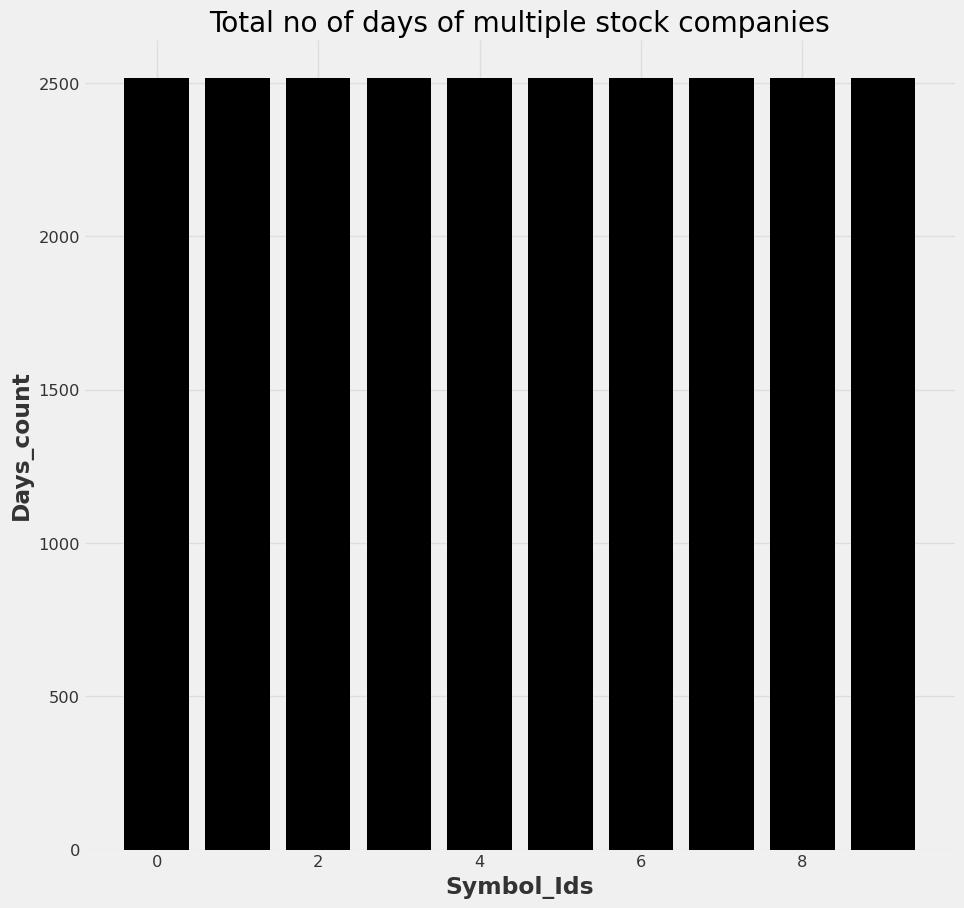

In [ ]:
all_companies_path=f'./{folder_name}/stock_ohlc'
companies_dict=DataReader(all_companies_path).read_multiple_campanies()

print(f"Total Stocks: {len(companies_dict)}")
all_abbrev=list(companies_dict.keys())
print(f"All stock abbrev names: {all_abbrev})")
print(companies_dict["MSFT"].info())
ohlc_col=["Close","Open","High","Low"]
companies_dict=myutil.replace_values_from_multiple_columns(ohlc_col,"$","",companies_dict,float)
print(companies_dict["MSFT"].info())
df,companies_dict=myutil.reduce_dataset(companies_dict,0)

fig = plt.figure(figsize=(10, 10))
plt.subplot(1, 1, 1)
plt.bar(df["Symbol_Ids"], df['Days_count'])
plt.xlabel('Symbol_Ids')
plt.ylabel('Days_count')
plt.title('Total no of days of multiple stock companies')


plt.show()


Total No of Days
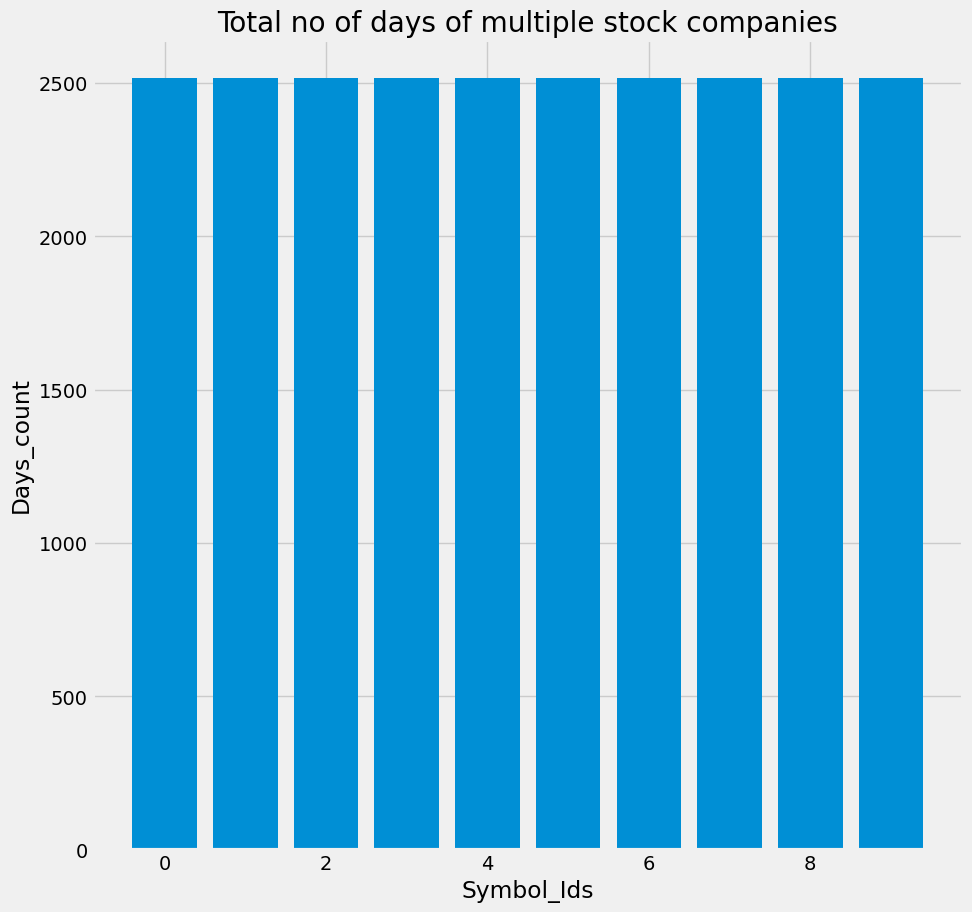


# **Data Cleaning and Handling Missing Values**
Some Dates were missing from the stock data so we have imputed the missing stock price data using the previous and next record and then taking average of the two prices. And for first and last row we use ffill and bfill methods

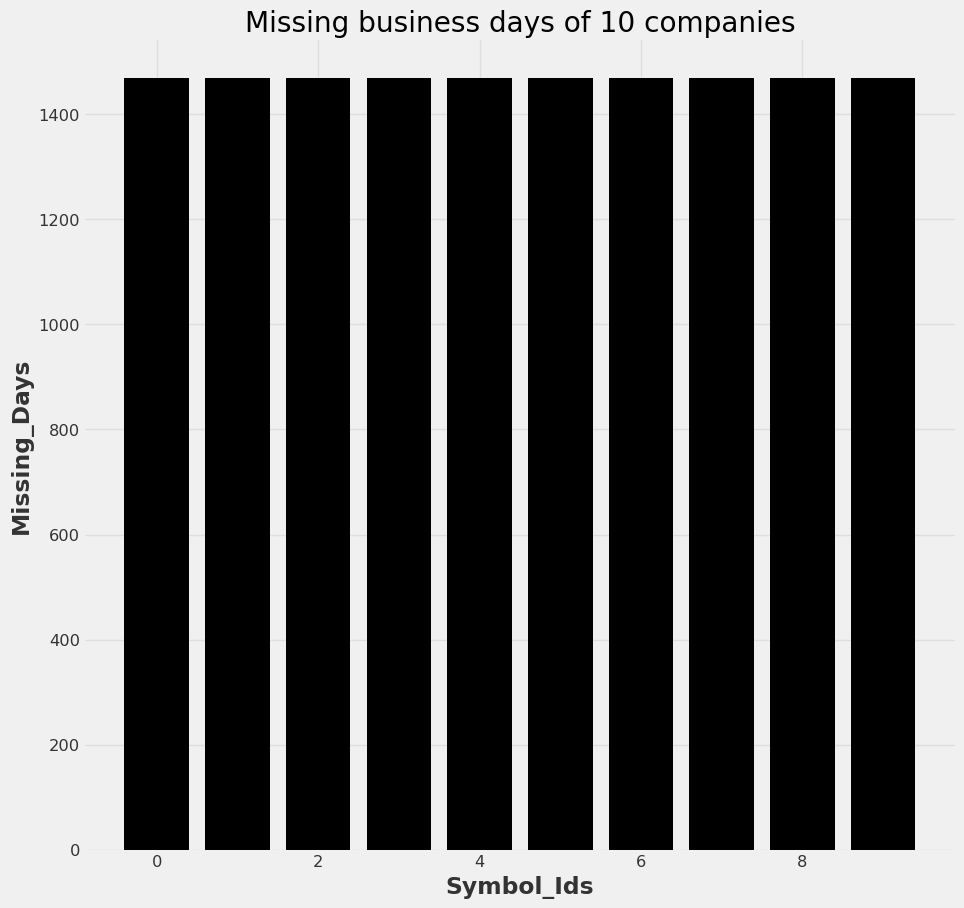

100%|██████████| 10/10 [01:06<00:00,  6.66s/it]


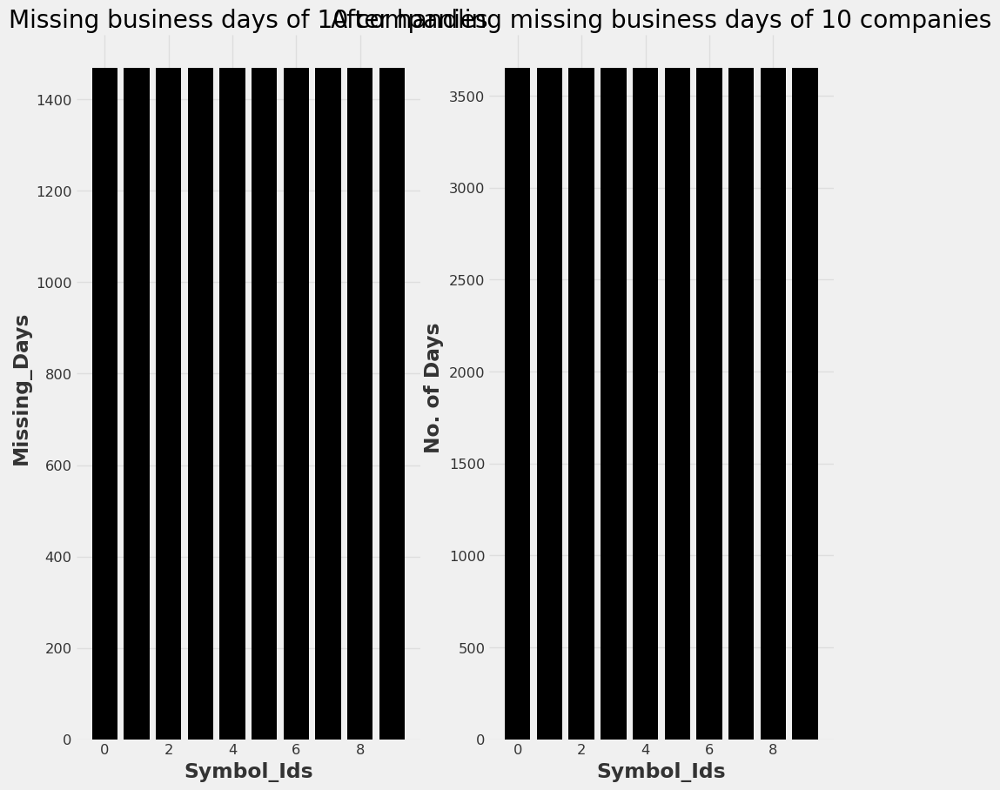

In [ ]:
#handling missing values


missing_days_count=myutil.count_missing_dates("2013-01-01","2023-11-29",companies_dict,exclude_holiday=False)
fig = plt.figure(figsize=(10, 10))
plt.bar(list(range(len(missing_days_count))), missing_days_count)
plt.xlabel('Symbol_Ids')
plt.ylabel('Missing_Days')
plt.title(f'Missing business days of {len(companies_dict)} companies')
plt.show()

companies_r=myutil.handle_missing_values(companies_dict,exclude_holiday=False)
companies=copy.deepcopy(companies_r)

#comparing after handling missing values
df_reduced,companies=myutil.reduce_dataset(companies_r,0)
#checking missing days on the dataset
complete_date_range = pd.date_range(start="2003-01-01", end="2019-01-01", freq='D')


# Create the first subplot
fig = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.bar(list(range(len(missing_days_count))), missing_days_count)
plt.xlabel('Symbol_Ids')
plt.ylabel('Missing_Days')
plt.title(f'Missing business days of {len(companies)} companies')


# Create the second subplot
plt.subplot(1, 2, 2)
plt.bar(df_reduced["Symbol_Ids"], df_reduced['Days_count'])
plt.xlabel('Symbol_Ids')
plt.ylabel('No. of Days')
plt.title(f'After handling missing business days of {len(companies)} companies')

plt.show()

After Imputing values
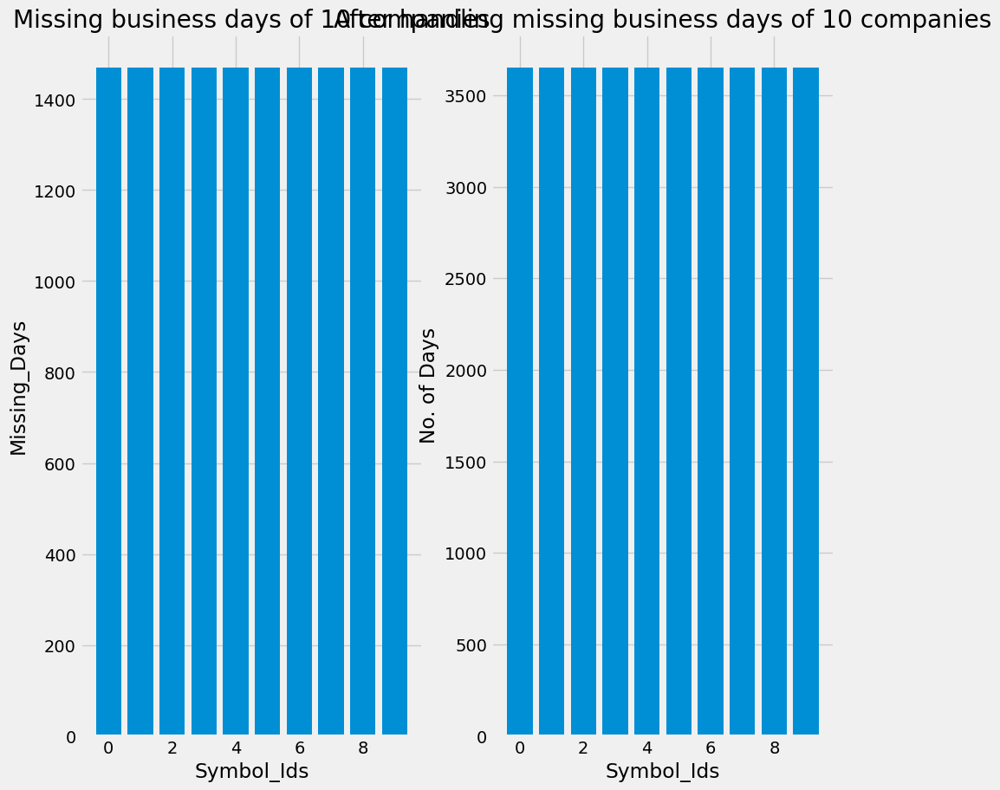

**C)Normalization and Scaling**
  Scaling is an essential preprocessing step in machine learning, and it involves transforming the features of a dataset to be on a similar scale.
  Scaling ensures that all features contribute equally to the model training process, preventing the dominance of one feature over another.

  We have used Standard Scaling Method to scale our dataset features

  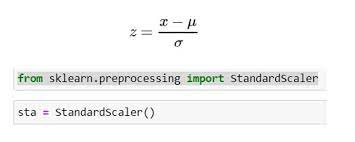


# Exploratory Data Analysis (EDA)

**Line Graph**
line graph for stock data with OHLC (Open, High, Low, Close) and Volume

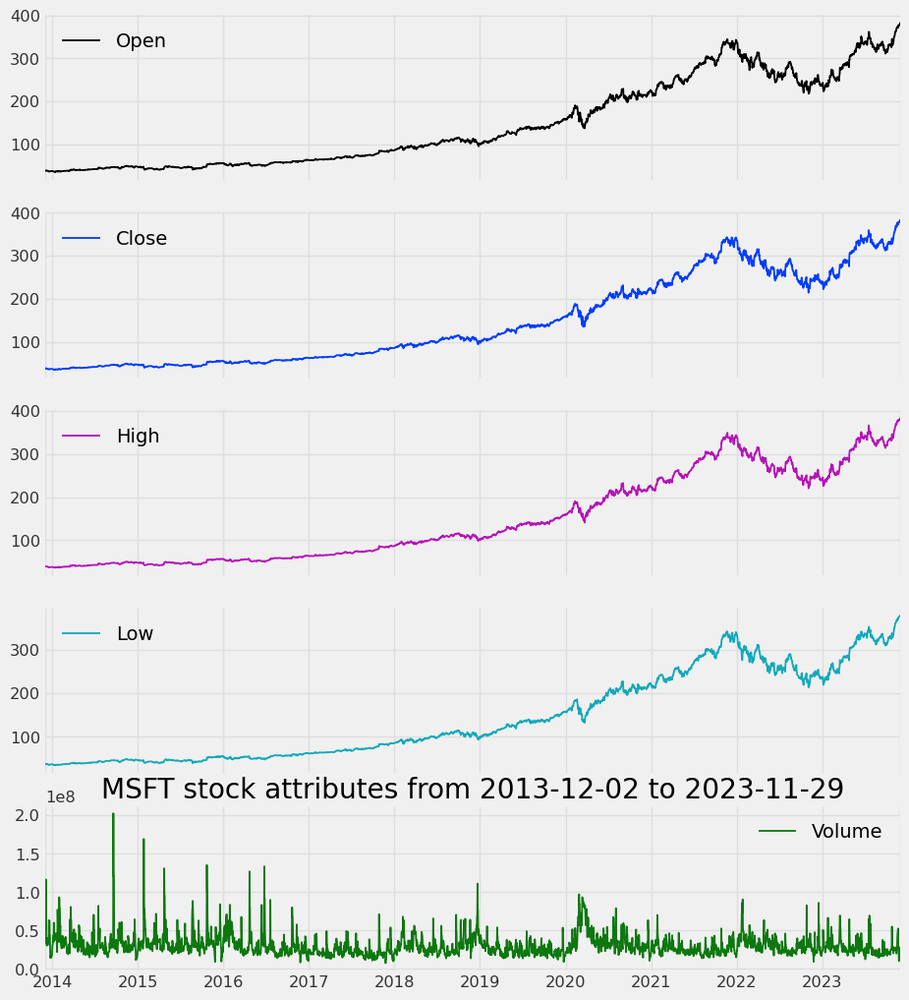

In [ ]:
visual.plot_line_graph("MSFT",companies["MSFT"],subplots=True)

**Lag / Shift Graph of Stock Price**

A lag or shift graph in the context of stock prices involves plotting a time series against its own past values with a certain time lag. This type of graph helps visualize how the current value of a variable is related to its past values. The x-axis represents the current time, and the y-axis represents the value of the variable.

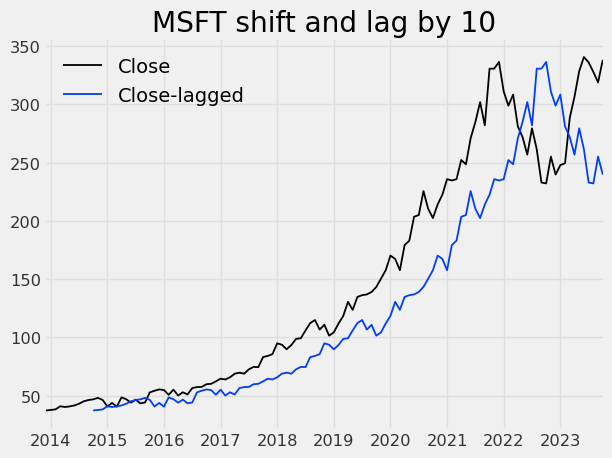

In [ ]:
visual.plot_shift_and_lags("MSFT",companies["MSFT"],columns=["Close"],subplots=False)

**Percentage Change of OHCL Price of Stock**
The percentage change of OHLC (Open, High, Low, Close) prices of a stock can be calculated to represent the relative price movements over a given period. The percentage change for each OHLC value is calculated as the difference between the current day's value and the previous day's value, divided by the previous day's value, and then multiplied by 100 to express it as a percentage.


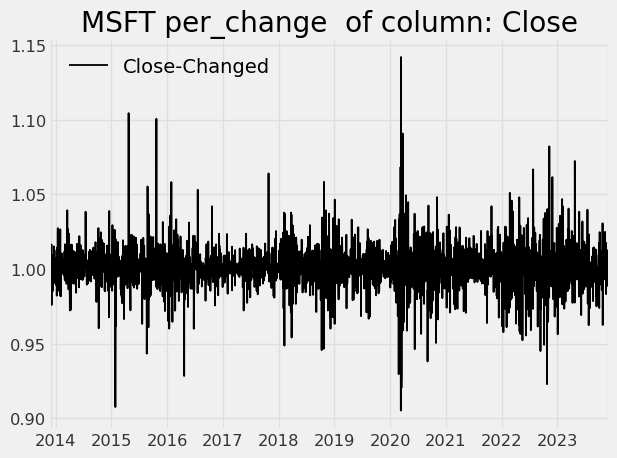

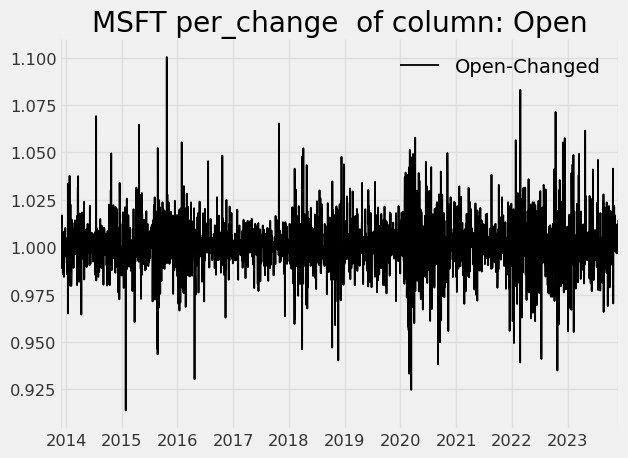

In [ ]:
visual.plot_percentage_change("MSFT",companies["MSFT"],columns=["Close","Open"],subplots=False)

**Comparison of multiple stocks**

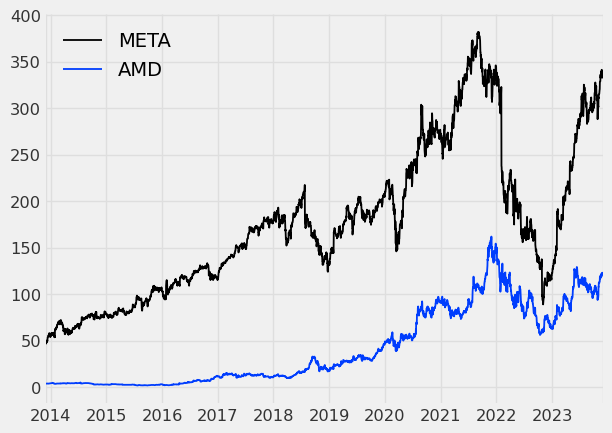

In [ ]:
visual.plot_compare_n_stocks({"META":companies["META"],"AMD":companies["AMD"]})

**Comparision of High Price And Rolling Mean**

The rolling mean, also known as the moving average, is a statistical calculation commonly used in time series analysis to smooth out short-term fluctuations and highlight long-term trends or cycles. In the context of stock prices, applying a rolling mean can help identify underlying trends and reduce the impact of daily or short-term price volatility.

The latest Rolling Average is obtained by multiplying the previous Rolling Average by n-1 periods, adding today's symbol price, and then dividing the total by n periods.

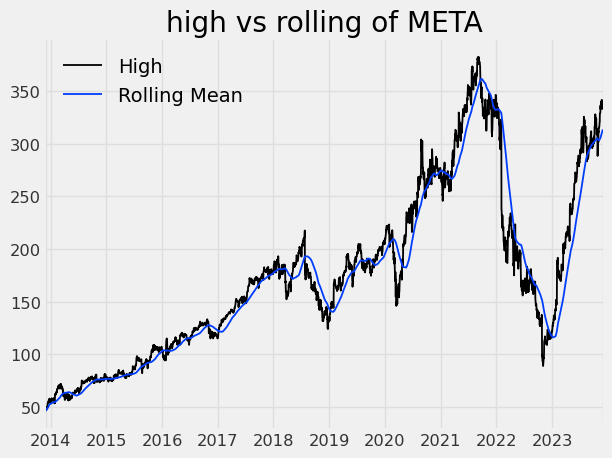

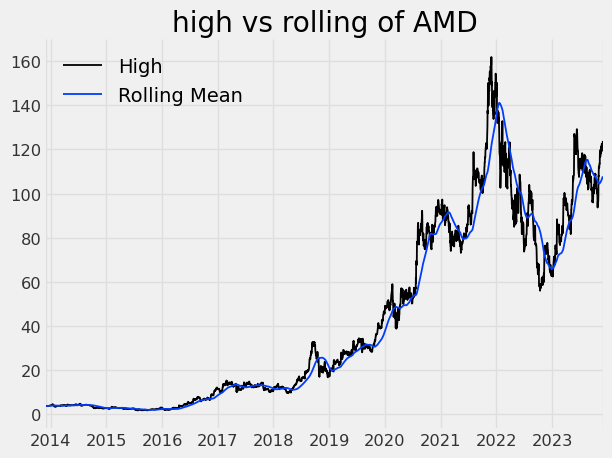

In [ ]:
visual.plot_window_function(["META","AMD"],[companies["META"],companies["AMD"]])

**Random Walk in Time Series**

A random walk is a type of time series where future values are determined by the previous period's value plus a random shock. In other words, a random walk assumes that each new observation in the time series is a random step away from the previous observation. It's a simple and commonly used model for financial time series, and it has implications for forecasting and statistical analysis.

In [ ]:
visual.check_is_random_walk(companies["AMD"])

p-value : 0.00013042147462815322 is_random_walk=False


**Autocorrelation** - The autocorrelation function (ACF) measures how a series is correlated with itself at different lags.Partial Autocorrelation - The partial autocorrelation function can be interpreted as a regression of the series against its past lags. The terms can be interpreted the same way as a standard linear regression, that is the contribution of a change in that particular lag while holding others constant.

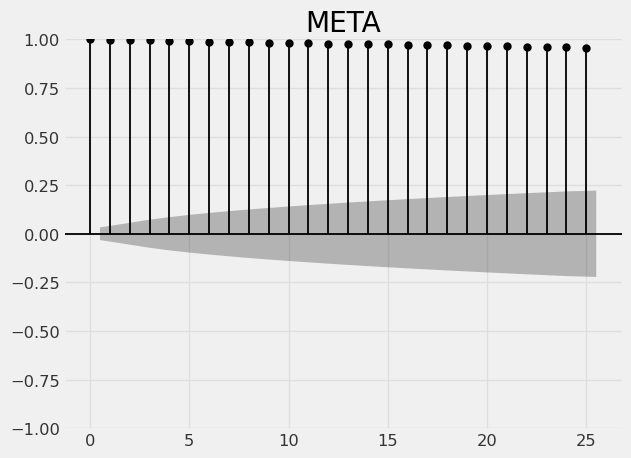

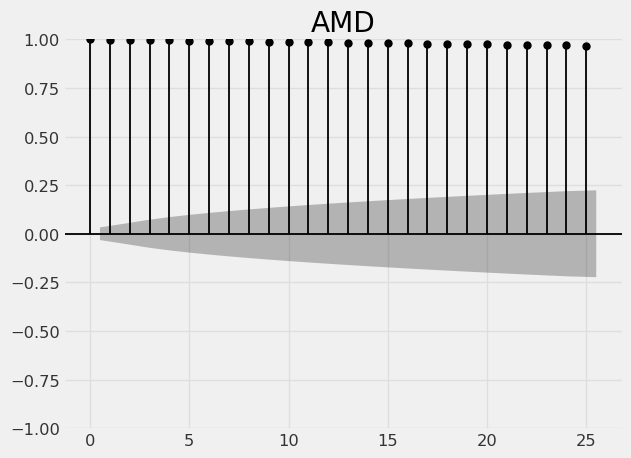

In [ ]:

visual.plot_auto_correlation({"META":companies["META"],"AMD":companies["AMD"]})

 The partial autocorrelation function can be interpreted as a regression
    of the series against its past lags. The terms can be interpreted the same way as a standard linear
    regression, that is the contribution of a change in that particular lag while holding others constant

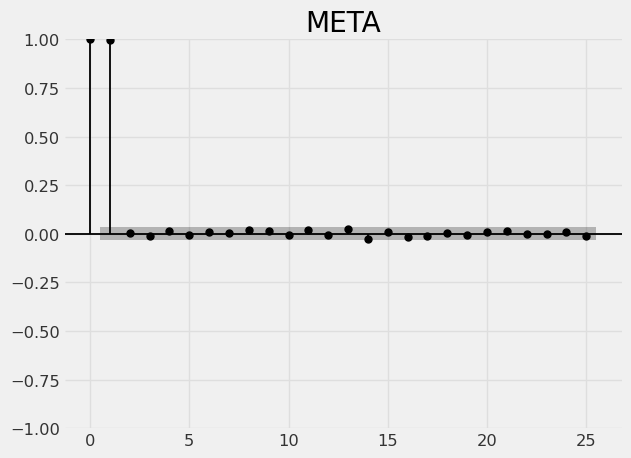

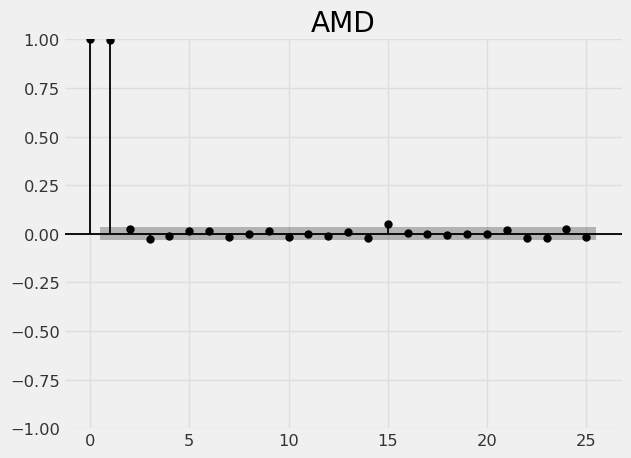

In [ ]:
visual.plot_partial_correlation({"META":companies["META"],"AMD":companies["AMD"]})

**Visualizing Stock Price Trends**


In [ ]:
visual.plot_line_chart(copy.deepcopy(companies))

**Seasonal Decomposition Analysis**

seasonal decomposition analysis involves breaking down a time series into its underlying components, typically including trend, seasonality, and residual (random noise). This analysis helps in understanding the underlying patterns and variations within the data. In the context of stock data, seasonality may refer to repetitive patterns or cycles that occur at regular intervals.

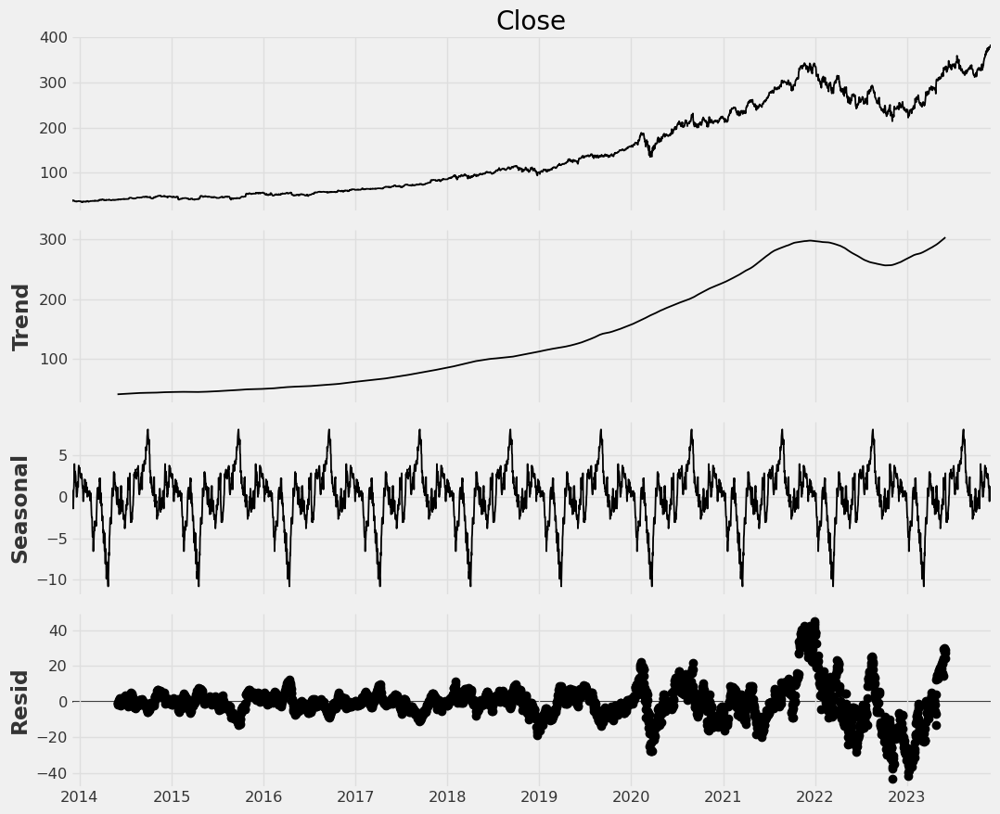

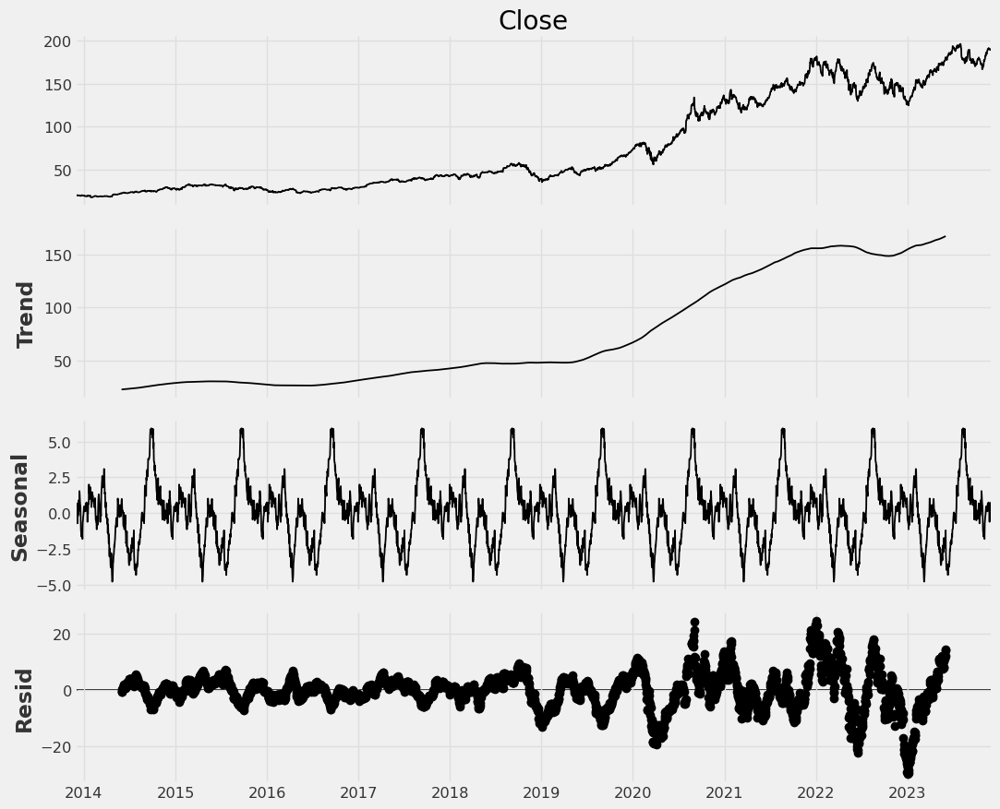

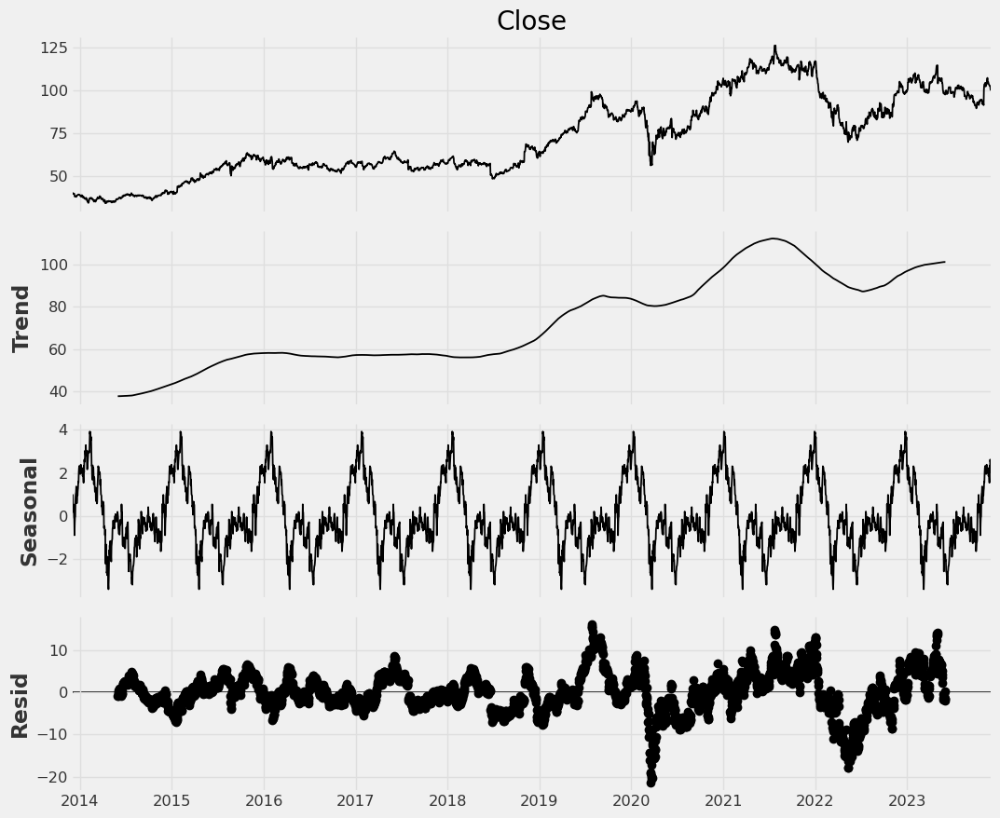

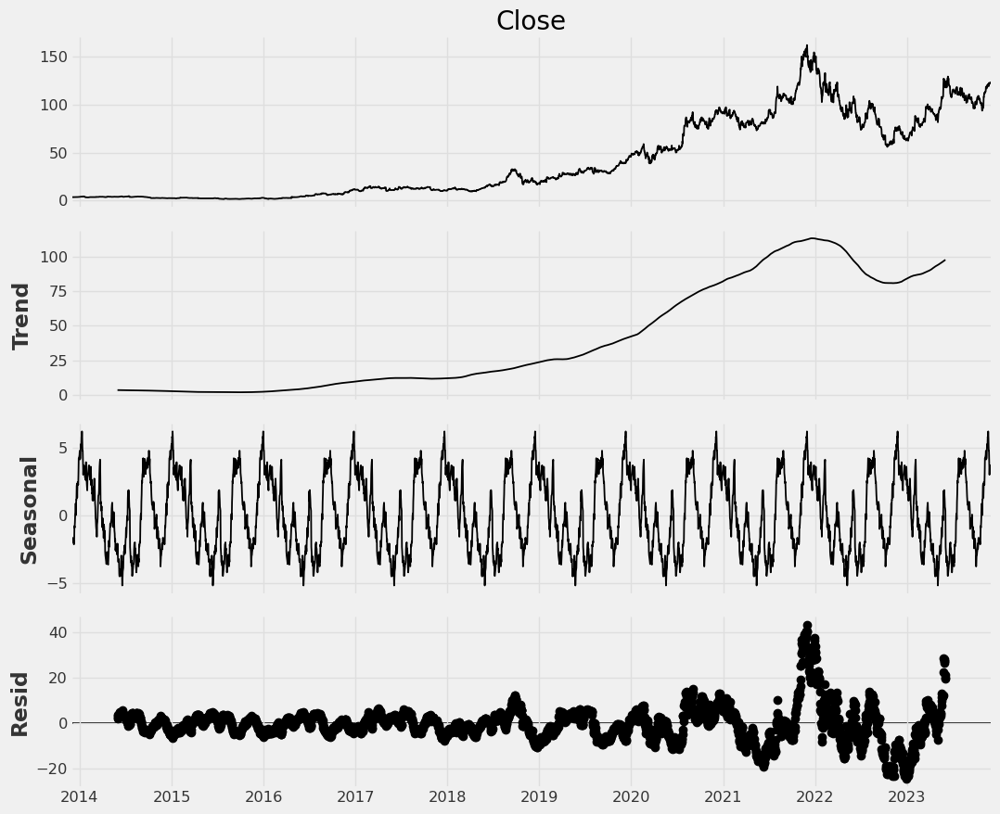

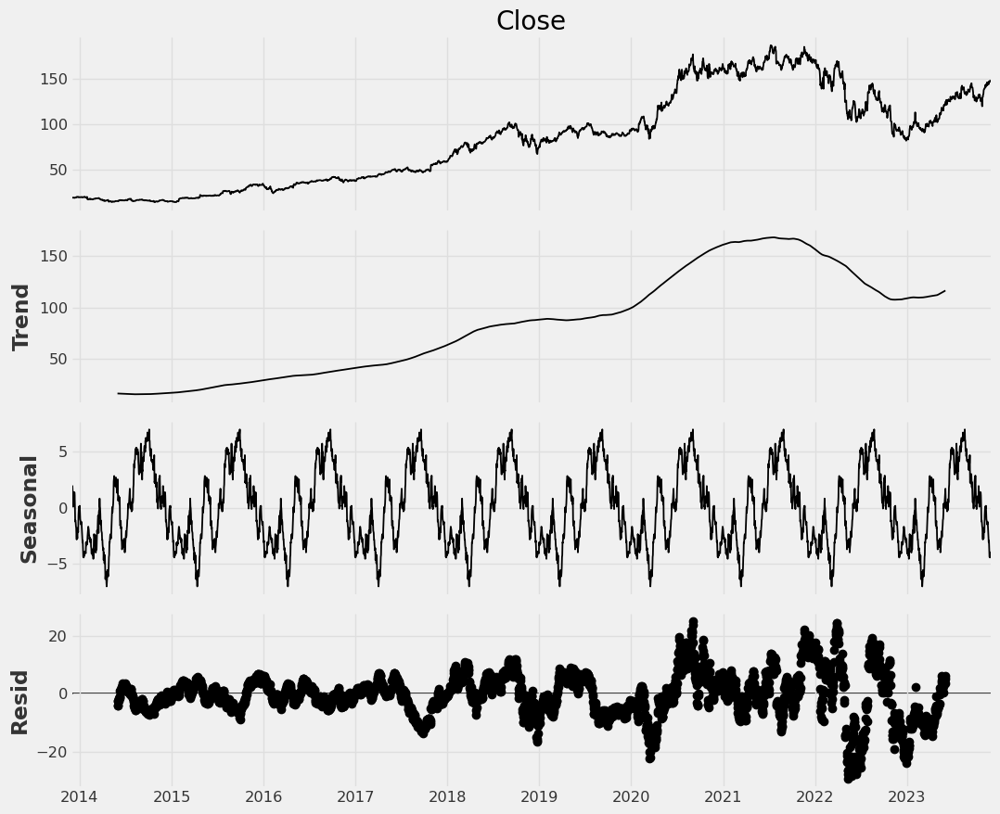

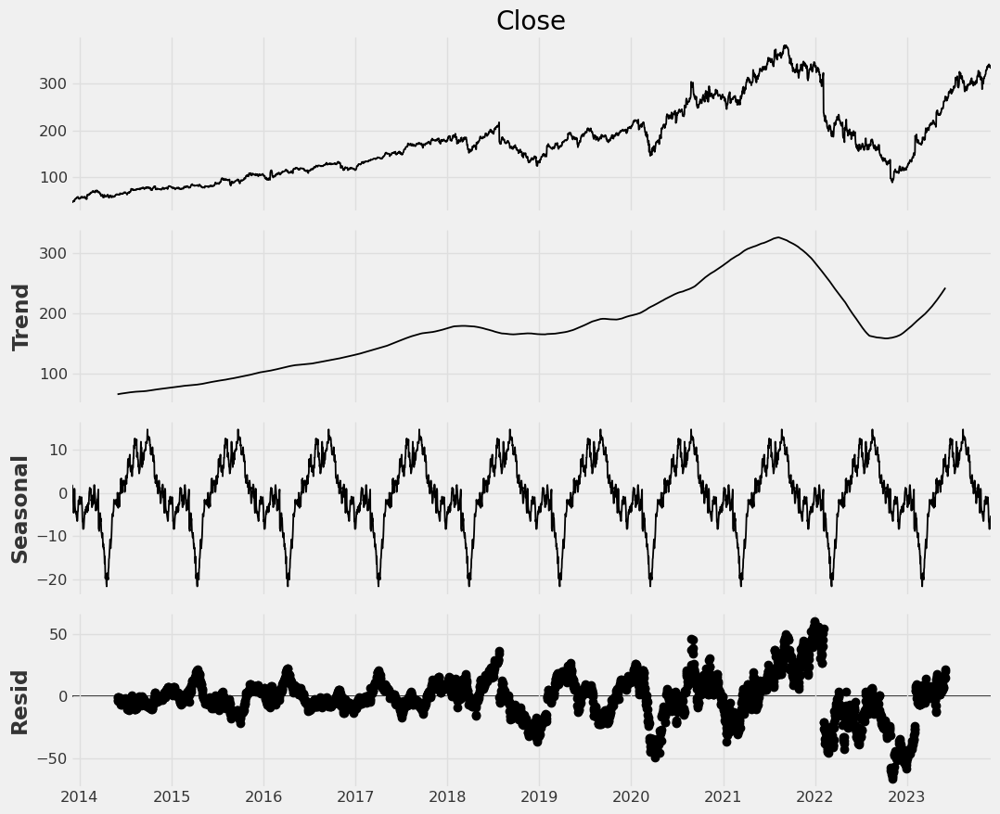

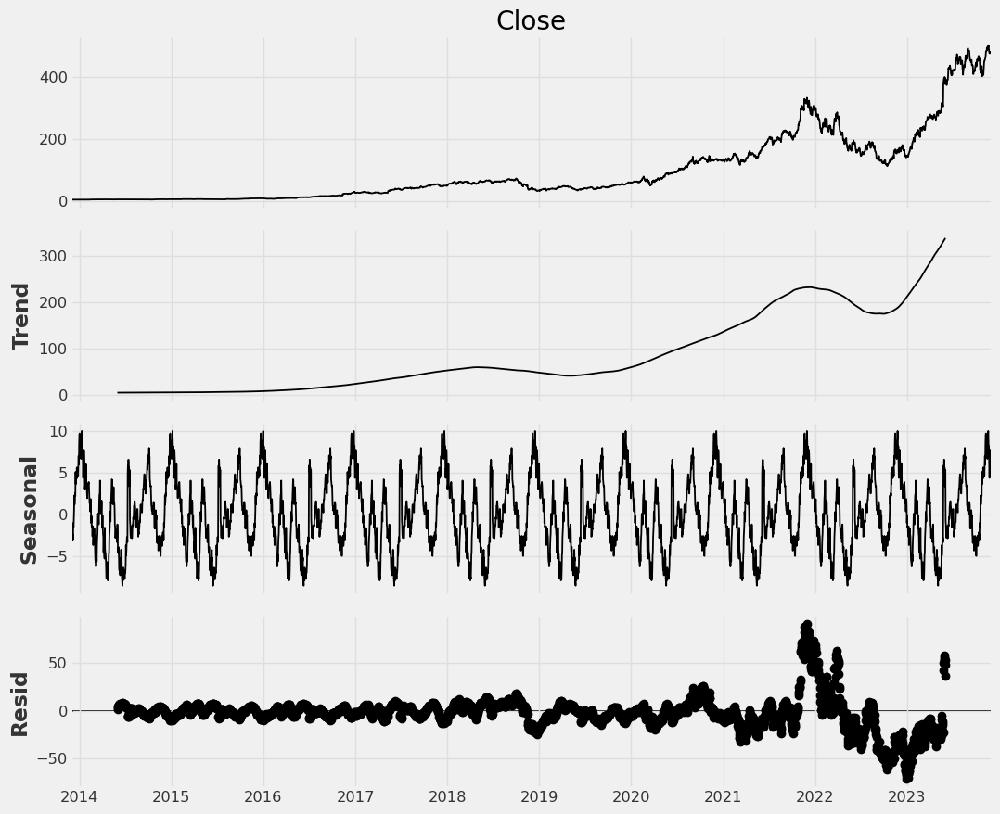

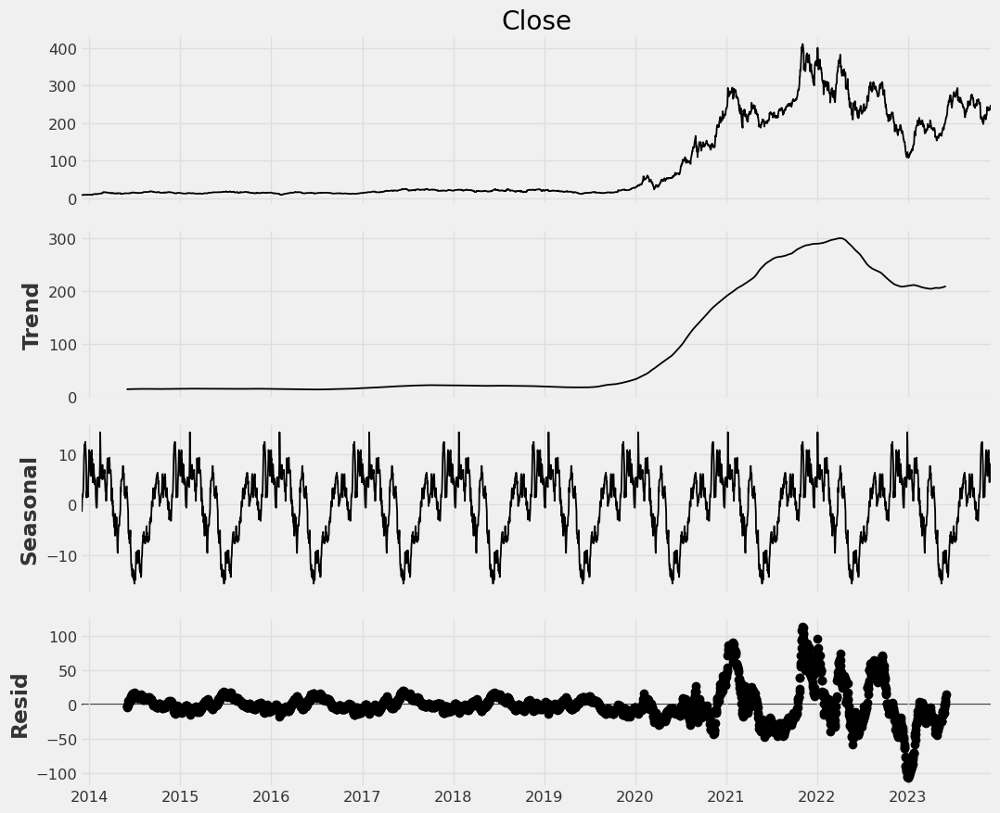

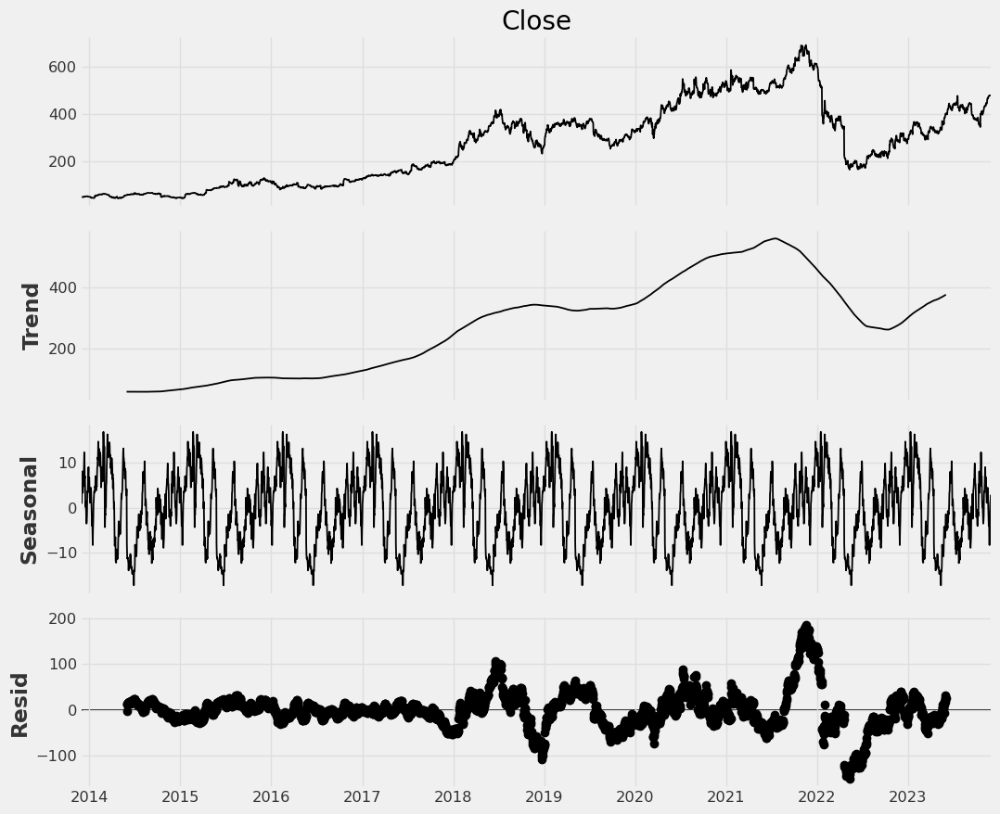

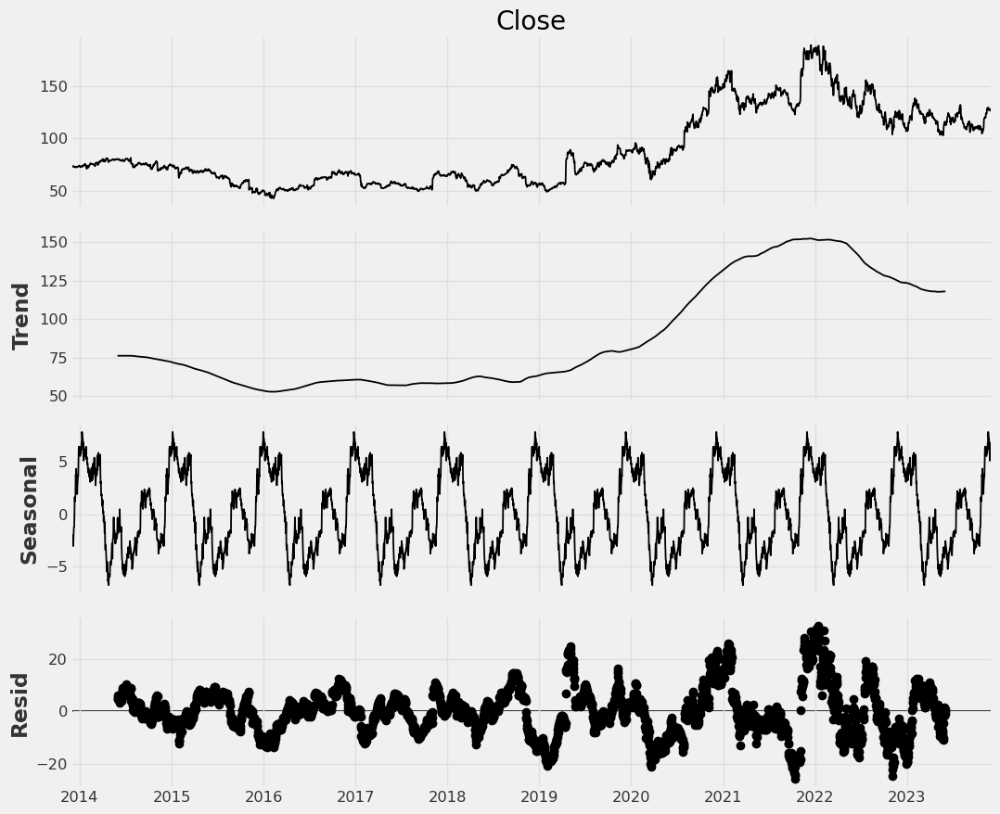

In [ ]:
visual.plot_time_series_component(copy.deepcopy(companies))

**Correlation Analysis with OHLC Components**

**Lag Plot for Autocorrelation of Companies**
A lag plot is a type of time series plot used in the analysis of time-dependent data, such as stock prices. It is designed to visualize the relationship between a variable and its lagged values (past observations). In the context of stock data, a lag plot helps explore whether there is any temporal autocorrelation or pattern in the stock prices over time.

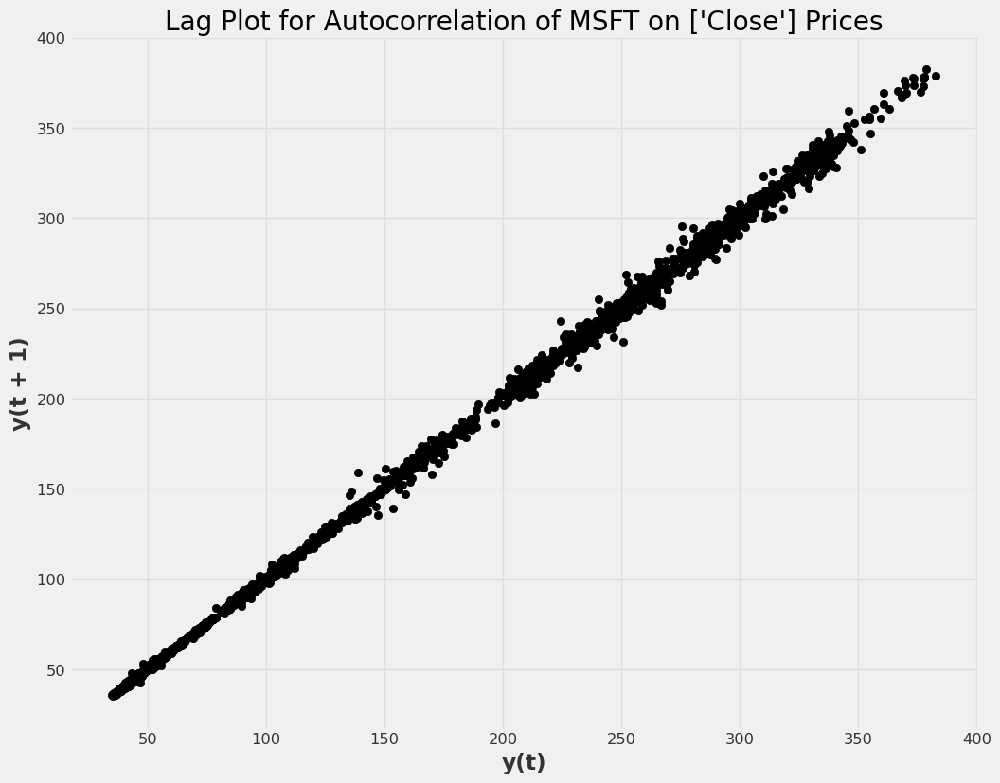

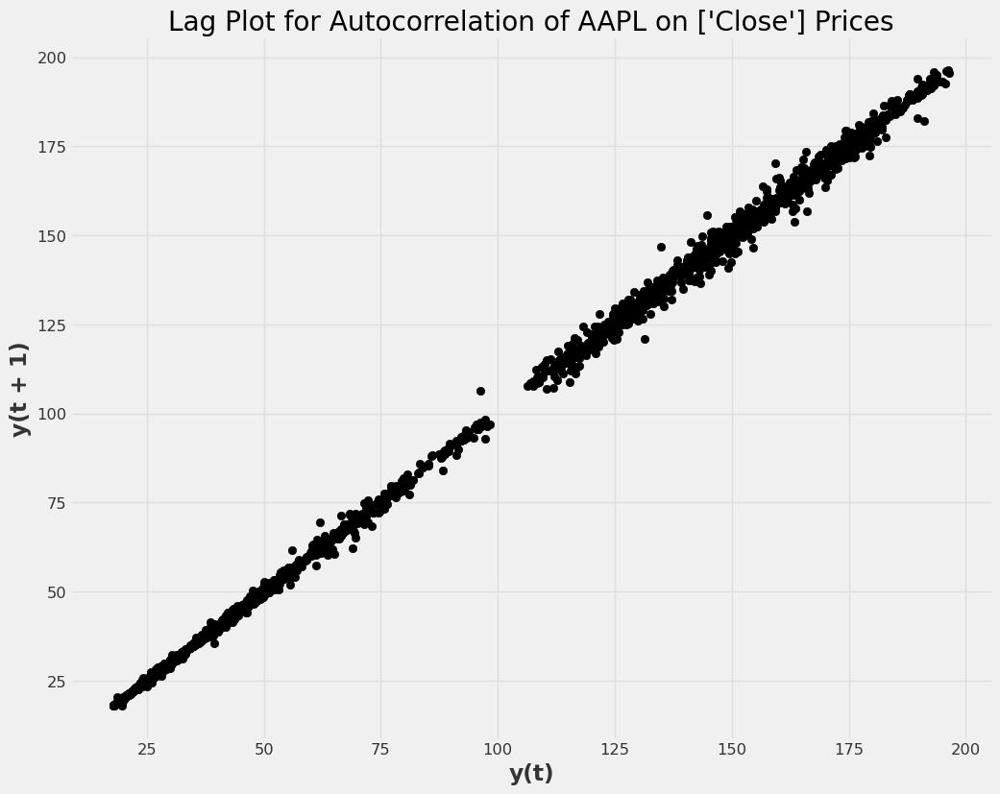

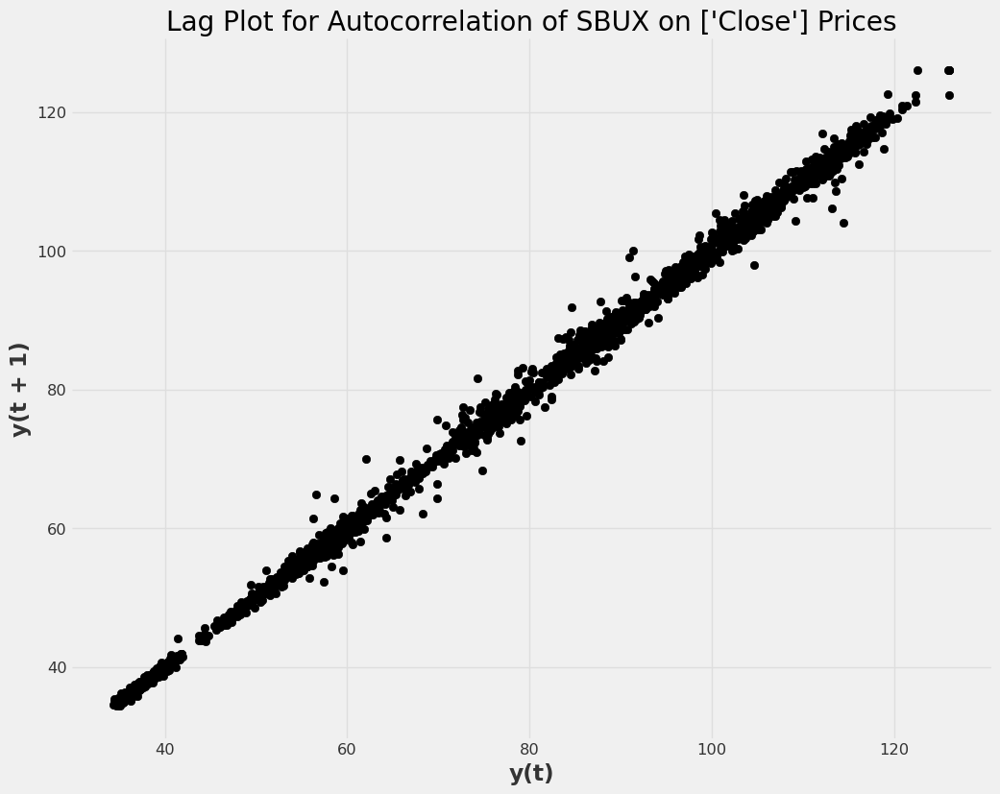

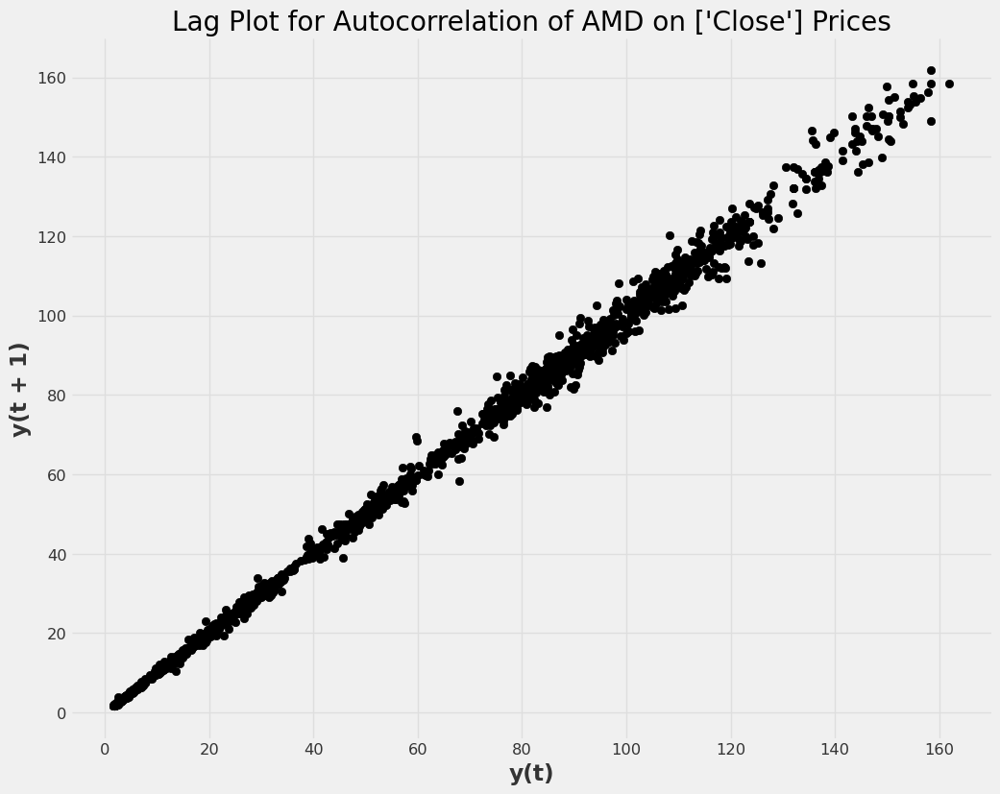

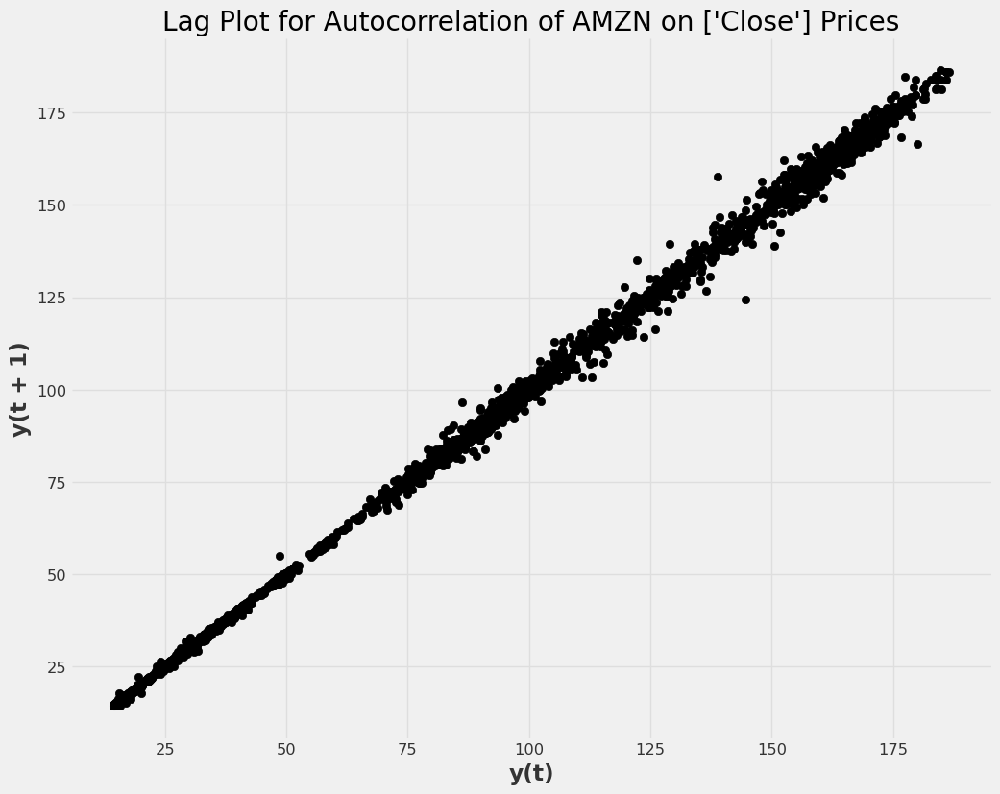

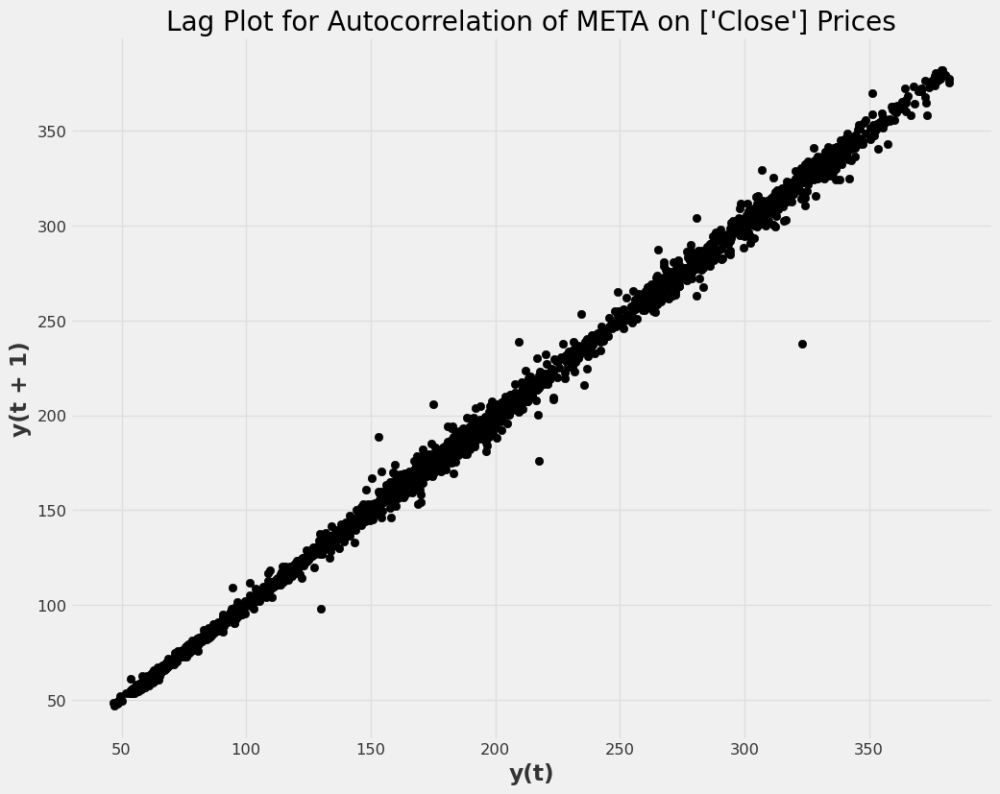

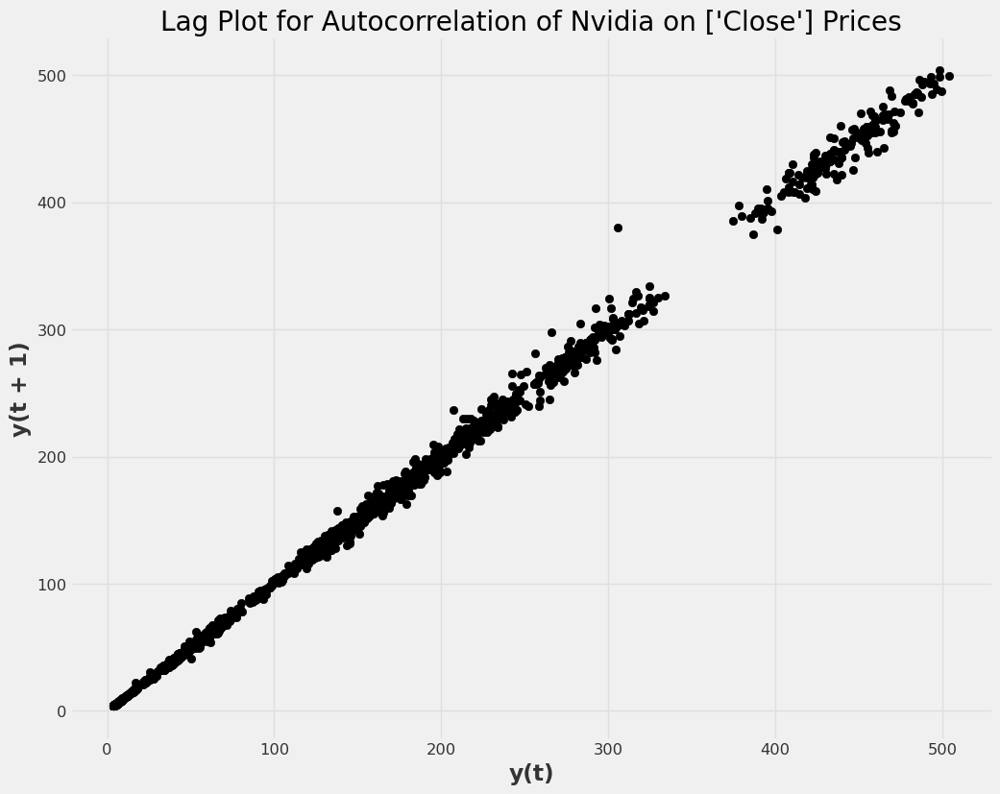

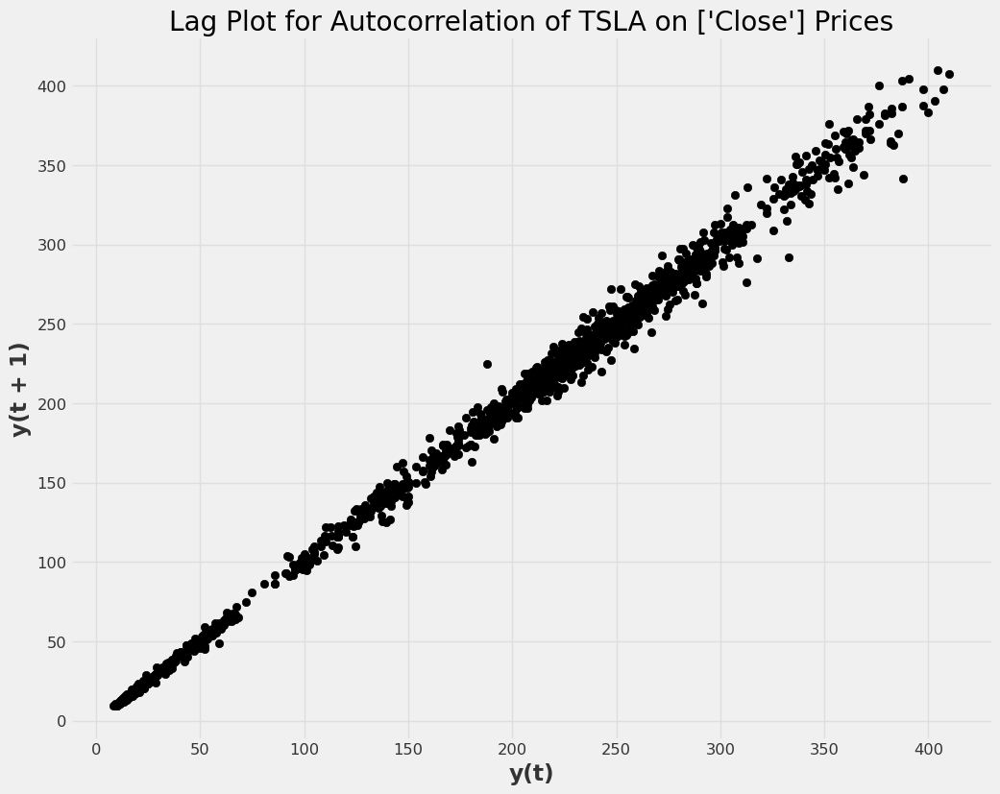

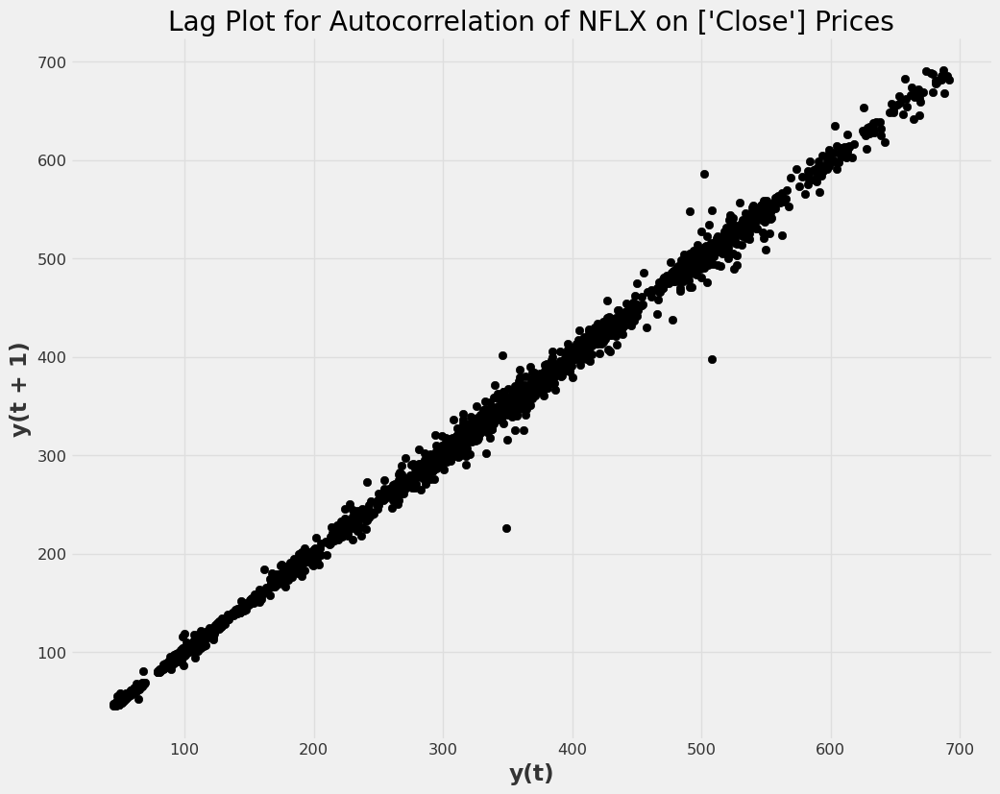

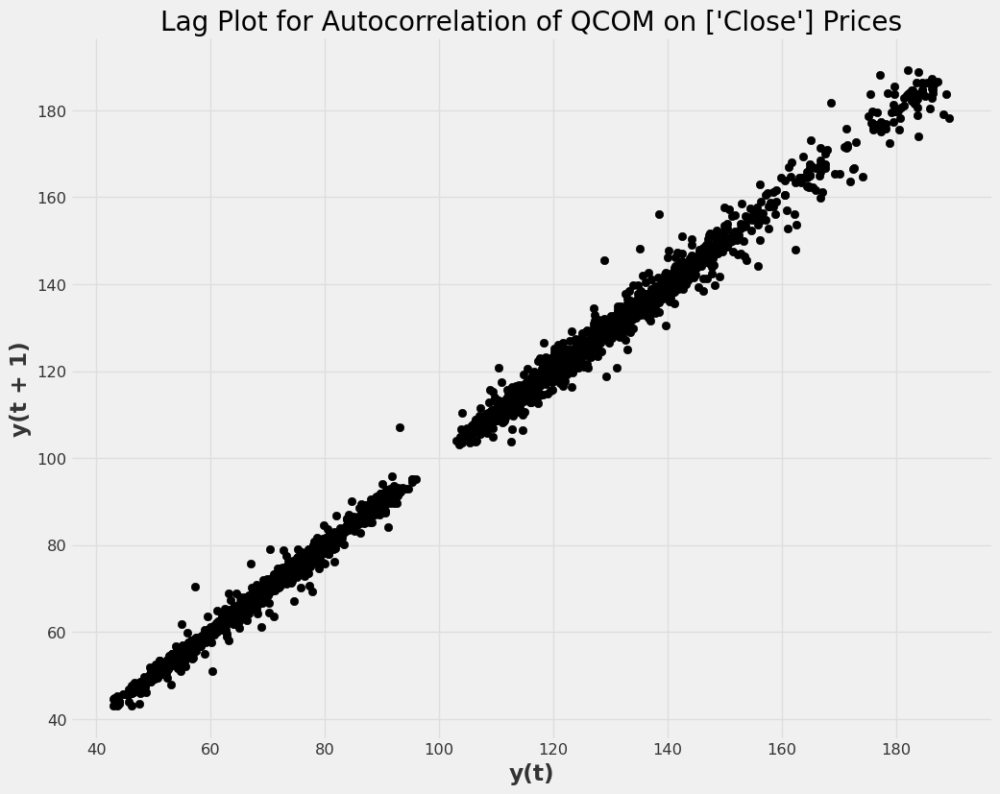

In [ ]:

visual.plot_lag(copy.deepcopy(companies),columns=["Close",],lag=1)

plot_return_analysis_graph


In [ ]:
visual.plot_return_analysis_graph(companies, list(companies.keys())[0:5])

**Historical volatility Graph**

Historical volatility, also known as realized volatility, is a measure of the dispersion of returns in the historical price of a financial instrument over a specific period. It provides insights into the level of price variability or risk associated with an asset.

Calculate the daily returns, which represent the percentage change in the stock price from one day to the next.Compute the standard deviation of the daily returns to get the historical volatility.

In [ ]:
visual.plot_historical_volatality(copy.deepcopy(companies))

plot_correlation_heat_map

In [ ]:
visual.plot_correlation_heat_map(companies,list(companies.keys())[0:5])

#**Machine Learning Models Regression And VotingRegressor(Ridge,Linear, )**

**Simple Linear Regression**

Historical Stock Data length is -  3650
Training Set length -  3212
Validation Set length -  365
Test Set length -  73
(3212, 4) (365, 4) (73, 4)
(3212,) (365,) (73,)
LR Coefficients: 
 [-2.14315857e-10 -6.73276539e-01  8.88606217e-01  7.83603279e-01]
LR Intercept: 
 0.05193732520487515
Performance (R^2):  0.9998806306443248
Training R-squared:  1.0
Training Explained Variation:  1.0
Training MAPE: 0.4
Training Mean Squared Error: 0.27
Training RMSE:  0.52
Training MAE:  0.28
 
Validation R-squared:  1.0
Validation Explained Variation:  1.0
Validation MAPE: 0.4
Validation Mean Squared Error: 0.27
Validation RMSE:  0.82
Validation MAE:  0.63
 
Test R-squared:  0.99
Test Explained Variation:  0.99
Test MAPE: 0.29
Test Mean Squared Error: 0.41
Test RMSE:  0.64
Test MAE:  0.53
Index(['Date', 'Actual', 'Predicted'], dtype='object')


<Axes: >

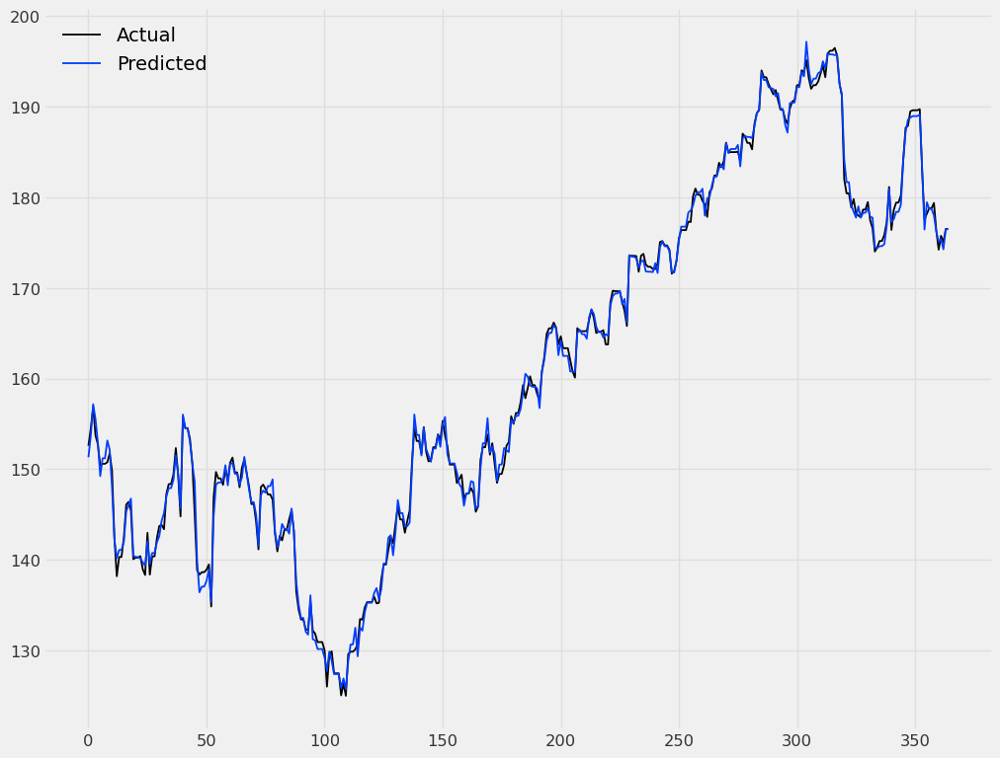

In [ ]:

X_train, X_val, X_test, Y_train, Y_val, Y_test = create_train_test_set(companies["AAPL"].dropna())
lr = LinearRegression()
lr.fit(X_train, Y_train)
print('LR Coefficients: \n', lr.coef_)
print('LR Intercept: \n', lr.intercept_)
print("Performance (R^2): ", lr.score(X_train, Y_train))
Y_train_pred = lr.predict(X_train)
Y_val_pred = lr.predict(X_val)
Y_test_pred = lr.predict(X_test)
print("Training R-squared: ",round(metrics.r2_score(Y_train,Y_train_pred),2))
print("Training Explained Variation: ",round(metrics.explained_variance_score(Y_train,Y_train_pred),2))
print('Training MAPE:', round(get_mape(Y_train,Y_train_pred), 2))
print('Training Mean Squared Error:', round(metrics.mean_squared_error(Y_train,Y_train_pred), 2))
print("Training RMSE: ",round(np.sqrt(metrics.mean_squared_error(Y_train,Y_train_pred)),2))
print("Training MAE: ",round(metrics.mean_absolute_error(Y_train,Y_train_pred),2))

print(' ')

print("Validation R-squared: ",round(metrics.r2_score(Y_val,Y_val_pred),2))
print("Validation Explained Variation: ",round(metrics.explained_variance_score(Y_val,Y_val_pred),2))
print('Validation MAPE:', round(get_mape(Y_val,Y_val_pred), 2))
print('Validation Mean Squared Error:', round(metrics.mean_squared_error(Y_train,Y_train_pred), 2))
print("Validation RMSE: ",round(np.sqrt(metrics.mean_squared_error(Y_val,Y_val_pred)),2))
print("Validation MAE: ",round(metrics.mean_absolute_error(Y_val,Y_val_pred),2))

print(' ')

print("Test R-squared: ",round(metrics.r2_score(Y_test,Y_test_pred),2))
print("Test Explained Variation: ",round(metrics.explained_variance_score(Y_test,Y_test_pred),2))
print('Test MAPE:', round(get_mape(Y_test,Y_test_pred), 2))
print('Test Mean Squared Error:', round(metrics.mean_squared_error(Y_test,Y_test_pred), 2))
print("Test RMSE: ",round(np.sqrt(metrics.mean_squared_error(Y_test,Y_test_pred)),2))
print("Test MAE: ",round(metrics.mean_absolute_error(Y_test,Y_test_pred),2))
df_pred = pd.DataFrame(Y_val.values, columns=['Actual'], index=Y_val.index)
df_pred['Predicted'] = Y_val_pred

df_pred = df_pred.reset_index()
df_pred=df_pred.rename(columns={"index":"Date"})
print(df_pred.columns)
df_pred.loc[:, 'Date'] = pd.to_datetime(df_pred['Date'],format='%Y-%m-%d')
df_pred
df_pred[['Actual', 'Predicted']].plot()



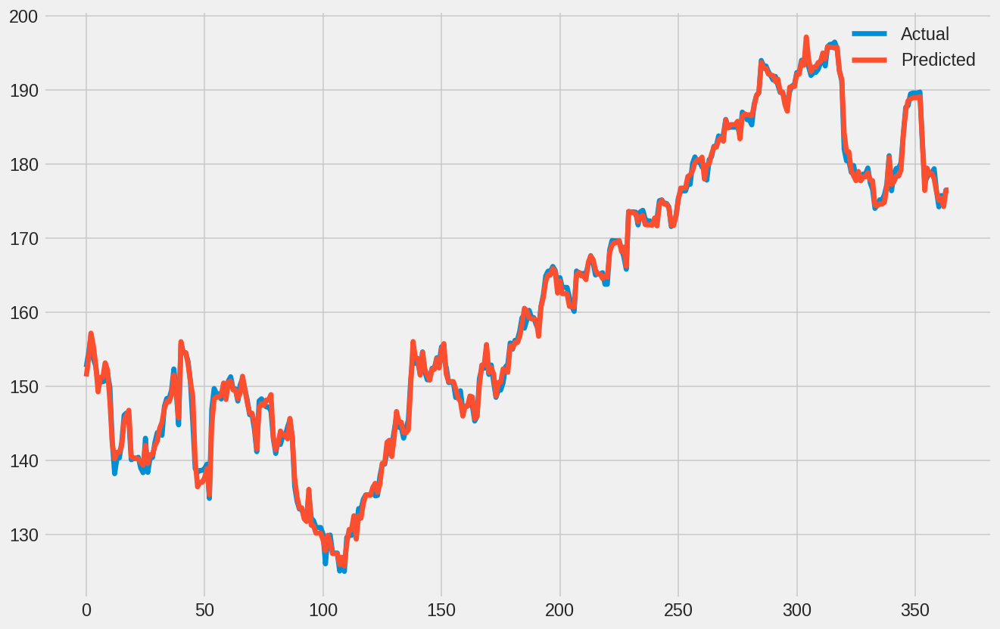

**VotingRegressor** Ensemble Technique


In [ ]:

companies_actual_predicted = {}
companies_performance_metric = {}

# Define window size and stride
window_size = 60
stride = 1

for key, value in companies.items():
  # Prepare windows
  xClose, yClose = prepare_windows(companies[key]['Close'].dropna(), window_size, stride)

  X_train = xClose[:int(len(xClose)*0.7)]
  y_train = yClose[:int(len(yClose)*0.7)]

  X_test = xClose[int(len(xClose)*0.7):]
  y_test = yClose[int(len(xClose)*0.7):]

  # scaler = StandardScaler()
  # X_train_scaled = scaler.fit_transform(X_train)
  # X_test_scaled = scaler.transform(X_test)

  # yscaler = StandardScaler()
  # y_train_scaled = yscaler.fit_transform(y_train)
  # y_test_scaled = yscaler.transform(y_test)

  # Define individual regression models
  svr_linear = SVR(kernel='linear', C=1, epsilon=0.1)
  ridge_linear=Ridge()
  linear_reg = LinearRegression()
  ard_reg=ARDRegression()

  # Create the VotingRegressor
  estimators=[
    ("linear_reg",linear_reg),
    ("ard_reg",ard_reg),
    ("ridge_linear",ridge_linear),
  ]
  voting_regressor = VotingRegressor(estimators=estimators)
  # Train the model
  voting_regressor.fit(X_train, y_train)
  # Make predictions
  predictions = voting_regressor.predict(X_test)
  # Evaluate the model
  print(f'\n\n{key} \n')
  companies_performance_metric[key] = evaluate_model(predictions.reshape(-1,1), y_test)
  companies_actual_predicted[key] = pd.DataFrame({'Actual': np.array(y_test).flatten(), 'Predicted': np.array(predictions).flatten()})




MSFT 

R-squared (R2) Score: 0.9886
Mean Squared Error (MSE): 16.7469
Root Mean Squared Error (RMSE): 4.0923
Mean Absolute Error (MAE): 2.8675
Median Absolute Error (MedAE): 1.9885
Maximum Error: 21.4953
Explained Variance Score: 0.9886


AAPL 

R-squared (R2) Score: 0.9869
Mean Squared Error (MSE): 4.8220
Root Mean Squared Error (RMSE): 2.1959
Mean Absolute Error (MAE): 1.5453
Median Absolute Error (MedAE): 1.0443
Maximum Error: 10.5666
Explained Variance Score: 0.9870


SBUX 

R-squared (R2) Score: 0.9876
Mean Squared Error (MSE): 1.8268
Root Mean Squared Error (RMSE): 1.3516
Mean Absolute Error (MAE): 0.8865
Median Absolute Error (MedAE): 0.5515
Maximum Error: 10.4087
Explained Variance Score: 0.9876


AMD 

R-squared (R2) Score: 0.9840
Mean Squared Error (MSE): 6.9889
Root Mean Squared Error (RMSE): 2.6437
Mean Absolute Error (MAE): 1.7803
Median Absolute Error (MedAE): 1.0922
Maximum Error: 14.1992
Explained Variance Score: 0.9841


AMZN 

R-squared (R2) Score: 0.9916
Mean Squar

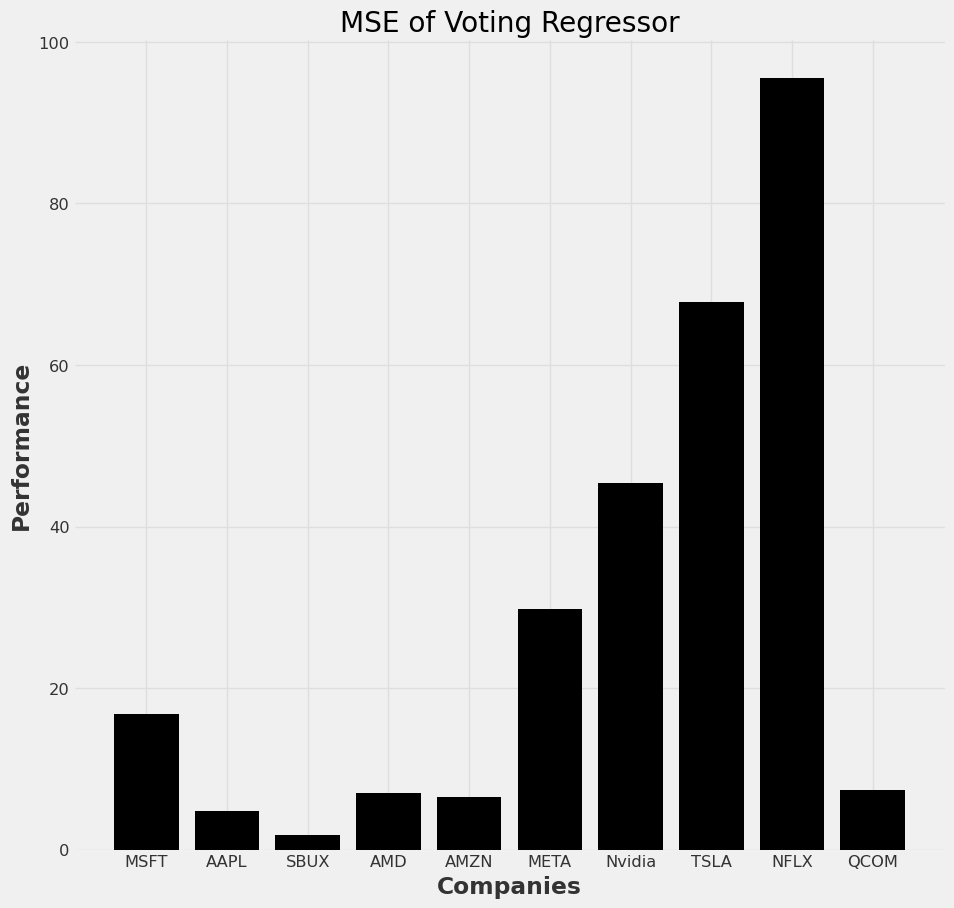

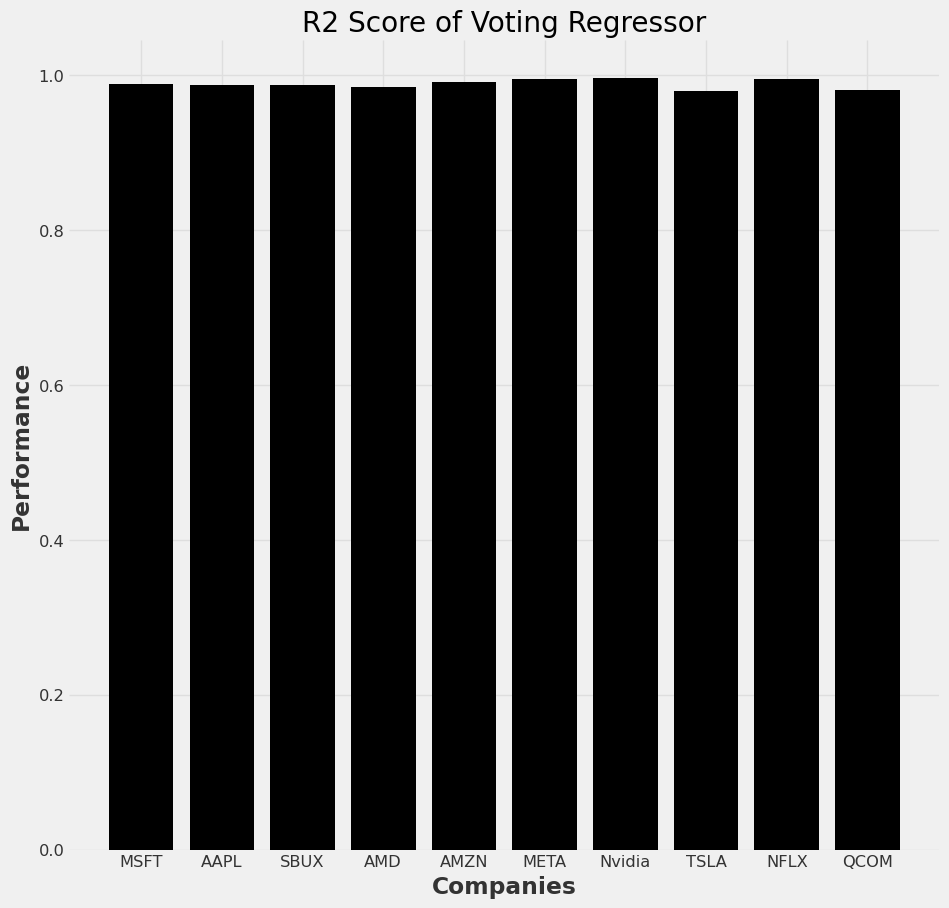

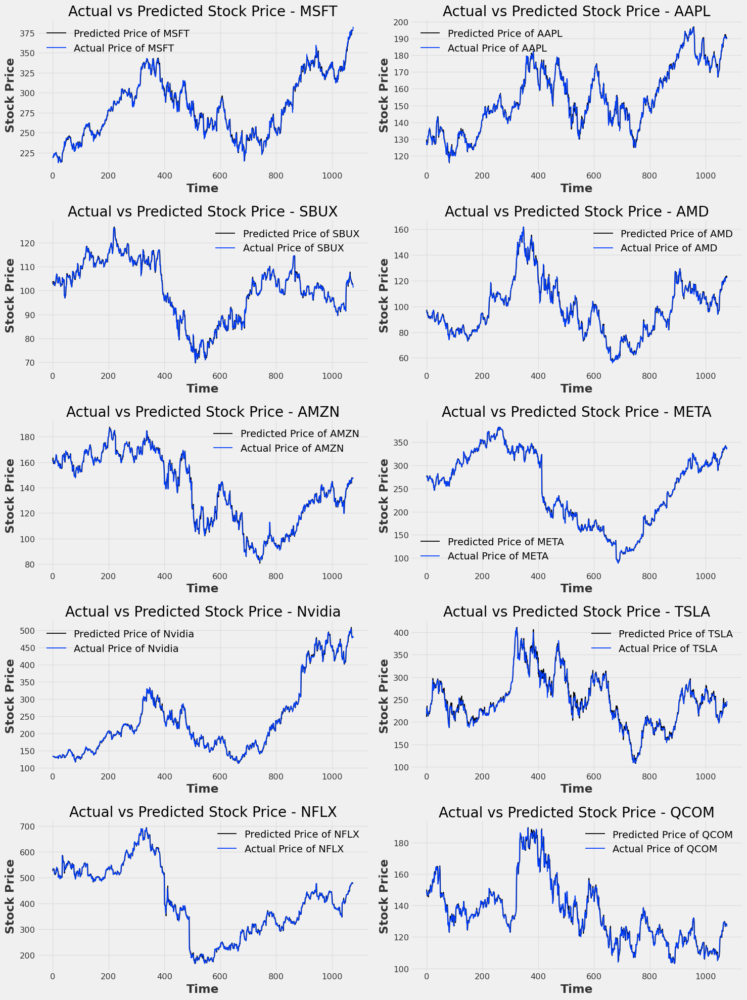

In [ ]:

visual.score_count_plot(companies_performance_metric.keys(), [ perf['mse'] for perf in companies_performance_metric.values()], 'MSE of Voting Regressor')
visual.score_count_plot(companies_performance_metric.keys(), [ perf['r2'] for perf in companies_performance_metric.values()], 'R2 Score of Voting Regressor')
visual.plot_multiple_actual_vs_predicted(companies_actual_predicted)


Voting Regression R2 squared


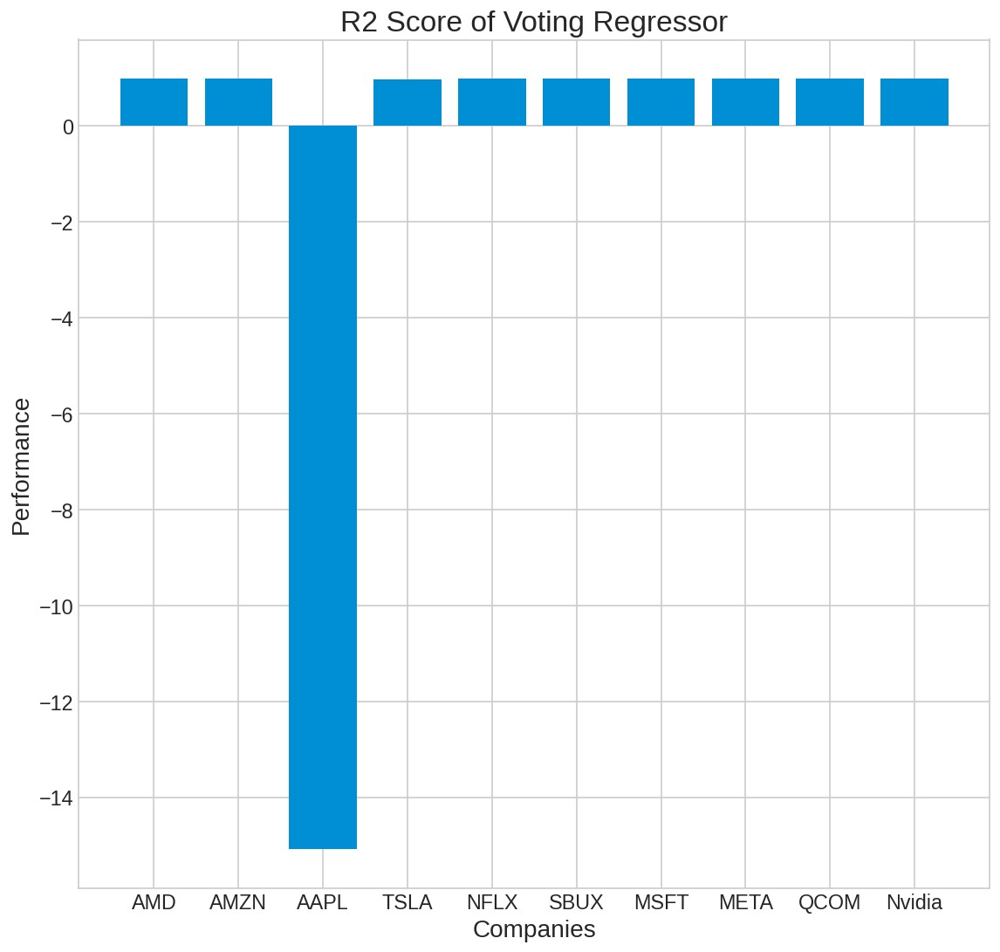

#**Deep Learning Models LSTM And NBeats**

**LSTM**

Epoch 1/2
255/255 [==============================] - 11s 6ms/step - loss: 0.0326
Epoch 2/2
35/35 [==============================] - 1s 3ms/step


MSFT 

R-squared (R2) Score: -0.4884
Mean Squared Error (MSE): 0.2902
Root Mean Squared Error (RMSE): 0.5387
Mean Absolute Error (MAE): 0.4164
Median Absolute Error (MedAE): 0.3299
Maximum Error: 1.5695
Explained Variance Score: 0.3364
Epoch 1/2
255/255 [==============================] - 6s 8ms/step - loss: 0.0338
Epoch 2/2
35/35 [==============================] - 1s 3ms/step


AAPL 

R-squared (R2) Score: -2.4286
Mean Squared Error (MSE): 0.6394
Root Mean Squared Error (RMSE): 0.7996
Mean Absolute Error (MAE): 0.6759
Median Absolute Error (MedAE): 0.5817
Maximum Error: 1.7684
Explained Variance Score: 0.0128
Epoch 1/2
255/255 [==============================] - 6s 6ms/step - loss: 0.0294
Epoch 2/2
35/35 [==============================] - 1s 4ms/step


SBUX 

R-squared (R2) Score: 0.9495
Mean Squared Error (MSE): 0.0277
Root Mean Squared Error

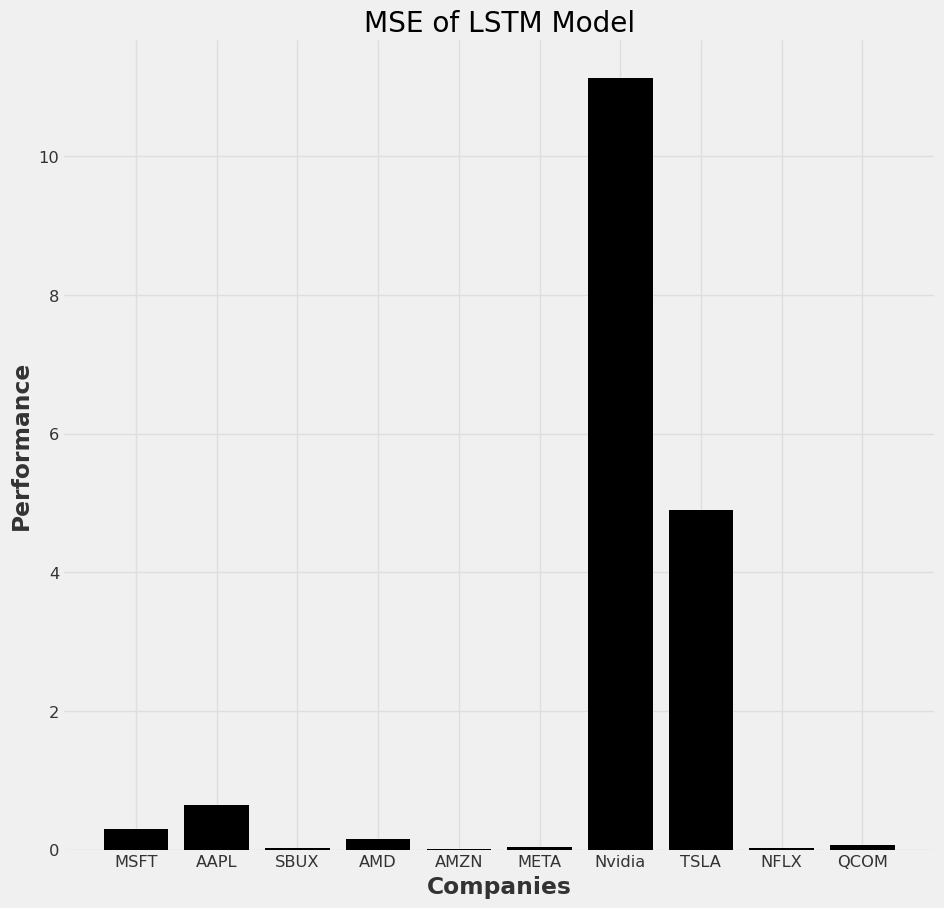

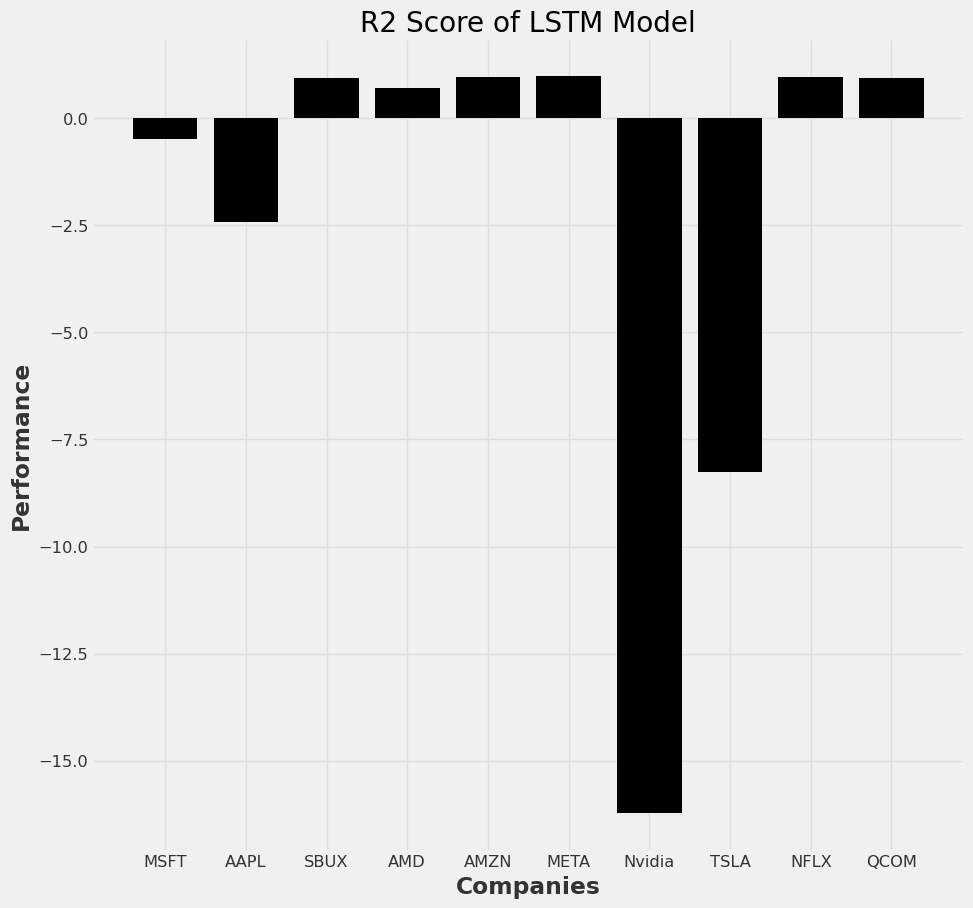

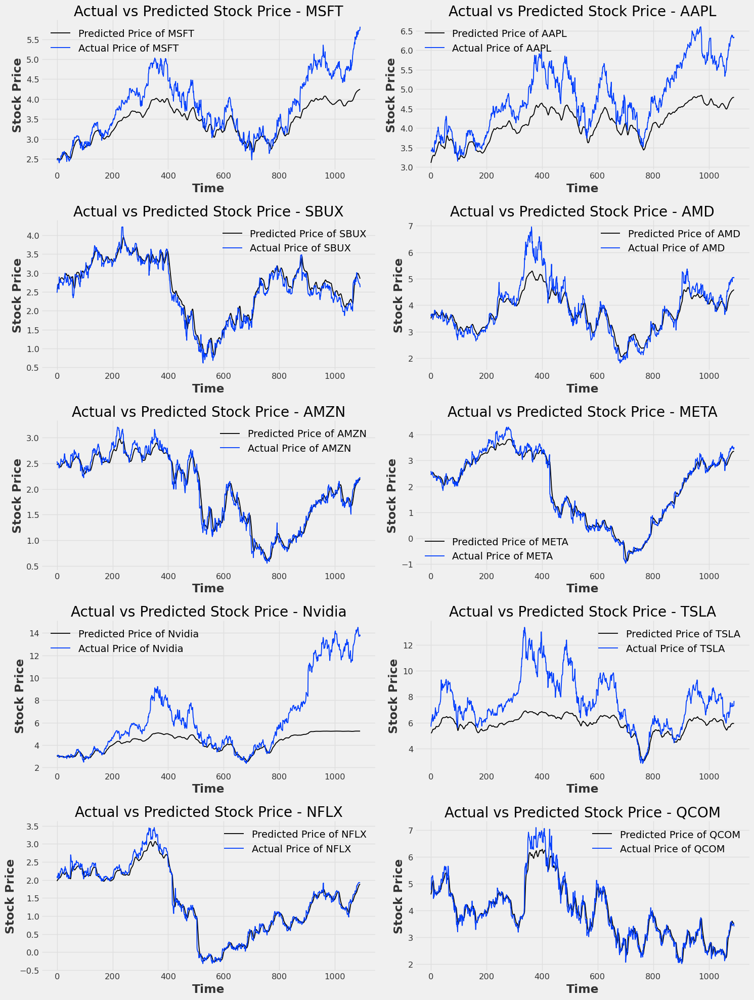

In [ ]:


window_size = 10
stride = 1

companies_actual_predicted = {}
companies_performance_metric = {}

for key, value in companies.items():
  # Prepare windows
  xClose, yClose = prepare_windows(companies[key]['Close'].dropna(), window_size, stride)

  X_train = xClose[:int(len(xClose)*0.7)]
  y_train = yClose[:int(len(yClose)*0.7)]

  X_test = xClose[int(len(xClose)*0.7):]
  y_test = yClose[int(len(xClose)*0.7):]

  scaler = StandardScaler()
  X_train_scaled = scaler.fit_transform(X_train)
  X_test_scaled = scaler.transform(X_test)

  yscaler = StandardScaler()
  y_train_scaled = yscaler.fit_transform(y_train)
  y_test_scaled = yscaler.transform(y_test)

  model_lstm = Sequential()
  model_lstm.add(
    LSTM(64,return_sequences=True,input_shape = (X_train_scaled.shape[1],1)))
  model_lstm.add(
    LSTM(64, return_sequences= False))
  model_lstm.add(Dense(32))
  model_lstm.add(Dense(1))
  model_lstm.compile(loss = "mean_squared_error", optimizer = "adam")
  history2 = model_lstm.fit(X_train_scaled, y_train_scaled, epochs = 2, batch_size = 10)

  predictions = model_lstm.predict(X_test_scaled)


  print(f'\n\n{key} \n')
  companies_performance_metric[key] = evaluate_model(predictions.reshape(-1,1), y_test_scaled)
  companies_actual_predicted[key] = pd.DataFrame({'Actual': np.array(y_test_scaled).flatten(), 'Predicted': np.array(predictions).flatten()})



visual.score_count_plot(companies_performance_metric.keys(), [ perf['mse'] for perf in companies_performance_metric.values()], 'MSE of LSTM Model')
visual.score_count_plot(companies_performance_metric.keys(), [ perf['r2'] for perf in companies_performance_metric.values()], 'R2 Score of LSTM Model')
visual.plot_multiple_actual_vs_predicted(companies_actual_predicted)

LSTIM R2 score


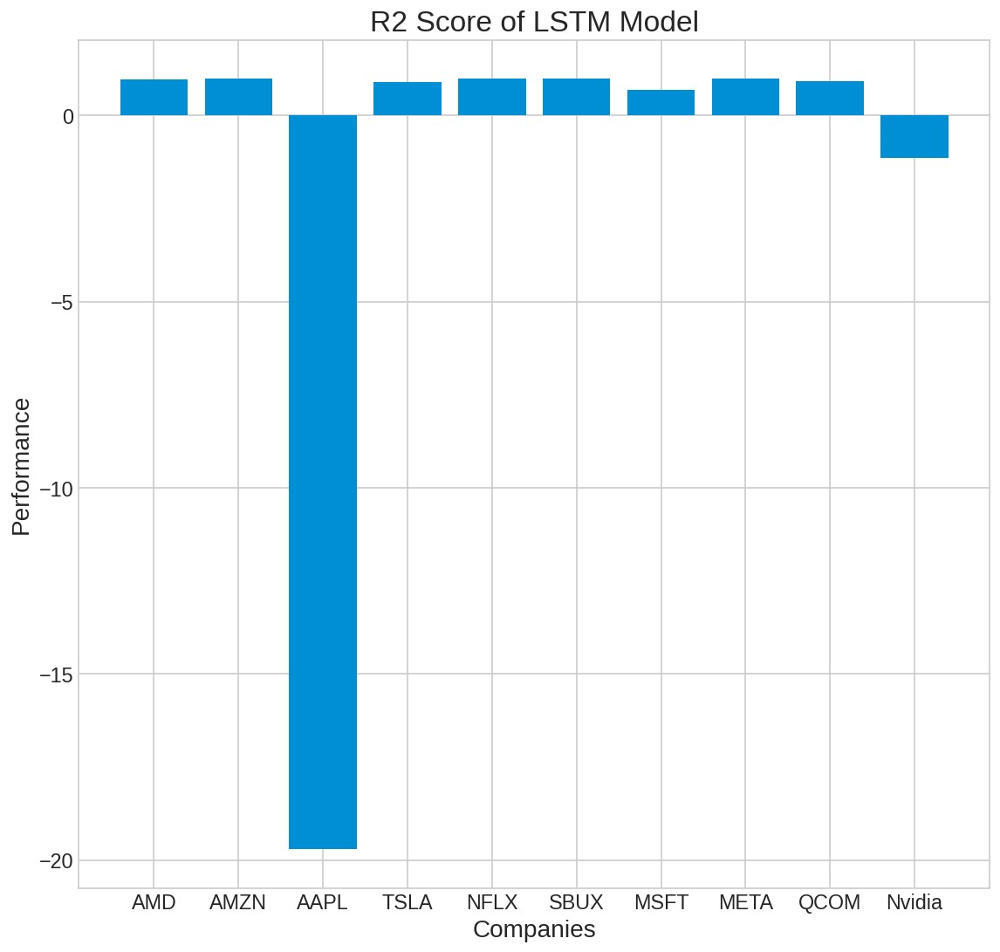

Lstm Perfomance
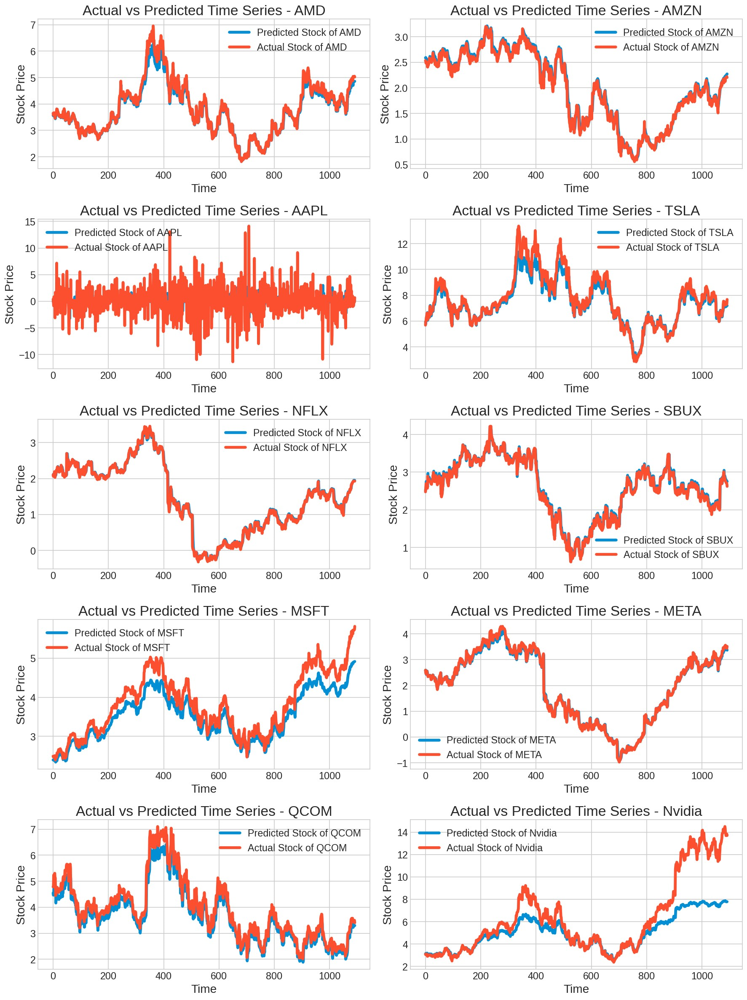

**N-Beats**

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 1.6 M 
---------------------------------------------------
1.6 M     Trainable params
15.9 K    Non-trainable params
1.6 M     Total params
6.517     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 1.6 M 
---------------------------------------------------
1.6 M     Trainable params
15.9 K    Non-trainable params
1.6 M     Total params
6.517     Total estimated model params 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 1.6 M 
---------------------------------------------------
1.6 M     Trainable params
15.9 K    Non-trainable params
1.6 M     Total params
6.517     Total estimated model params 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 1.6 M 
---------------------------------------------------
1.6 M     Trainable params
15.9 K    Non-trainable params
1.6 M     Total params
6.517     Total estimated model params 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 1.6 M 
---------------------------------------------------
1.6 M     Trainable params
15.9 K    Non-trainable params
1.6 M     Total params
6.517     Total estimated model params 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 1.6 M 
---------------------------------------------------
1.6 M     Trainable params
15.9 K    Non-trainable params
1.6 M     Total params
6.517     Total estimated model params 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 1.6 M 
---------------------------------------------------
1.6 M     Trainable params
15.9 K    Non-trainable params
1.6 M     Total params
6.517     Total estimated model params 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 1.6 M 
---------------------------------------------------
1.6 M     Trainable params
15.9 K    Non-trainable params
1.6 M     Total params
6.517     Total estimated model params 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 1.6 M 
---------------------------------------------------
1.6 M     Trainable params
15.9 K    Non-trainable params
1.6 M     Total params
6.517     Total estimated model params 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 1.6 M 
---------------------------------------------------
1.6 M     Trainable params
15.9 K    Non-trainable params
1.6 M     Total params
6.517     Total estimated model params 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


-----model loading path: /content/nbeats_interpretable_run-MSFT----
NBEATSModel(generic_architecture=False, num_blocks=3, layer_widths=512, activation=LeakyReLU, input_chunk_length=30, output_chunk_length=7, n_epochs=10, nr_epochs_val_period=1, batch_size=800, random_state=42, model_name=nbeats_interpretable_run, save_checkpoints=True, force_reset=True)


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

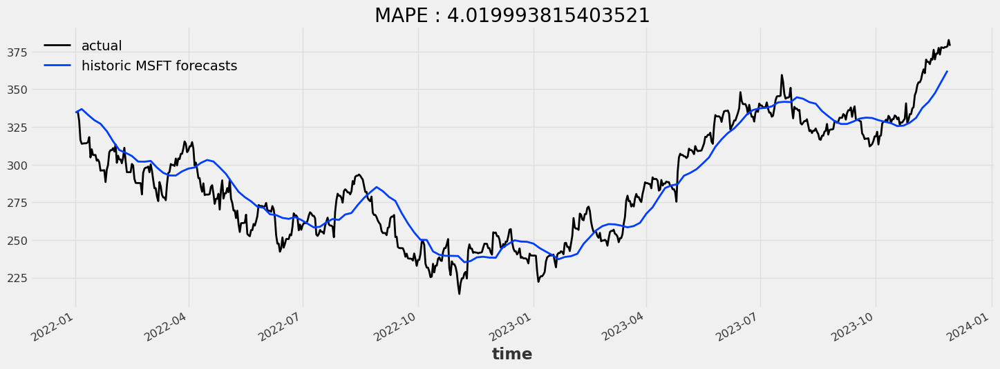

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


-----model loading path: /content/nbeats_interpretable_run-AAPL----
NBEATSModel(generic_architecture=False, num_blocks=3, layer_widths=512, activation=LeakyReLU, input_chunk_length=30, output_chunk_length=7, n_epochs=10, nr_epochs_val_period=1, batch_size=800, random_state=42, model_name=nbeats_interpretable_run, save_checkpoints=True, force_reset=True)


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

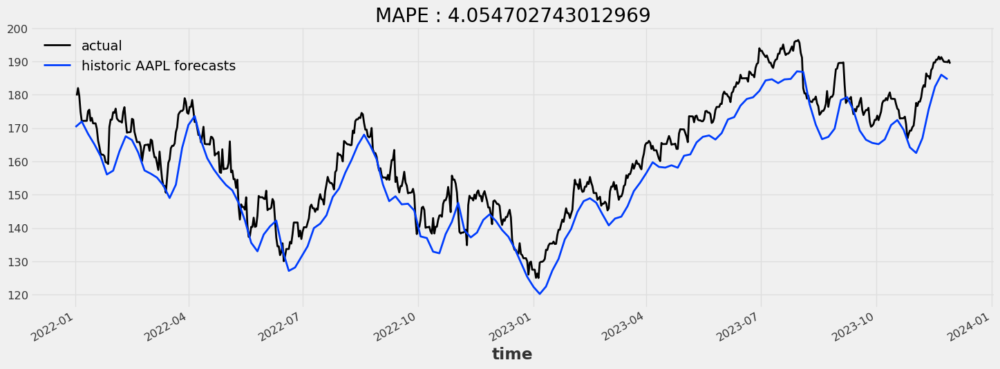

-----model loading path: /content/nbeats_interpretable_run-SBUX----


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


NBEATSModel(generic_architecture=False, num_blocks=3, layer_widths=512, activation=LeakyReLU, input_chunk_length=30, output_chunk_length=7, n_epochs=10, nr_epochs_val_period=1, batch_size=800, random_state=42, model_name=nbeats_interpretable_run, save_checkpoints=True, force_reset=True)


Predicting: |          | 0/? [00:00<?, ?it/s]

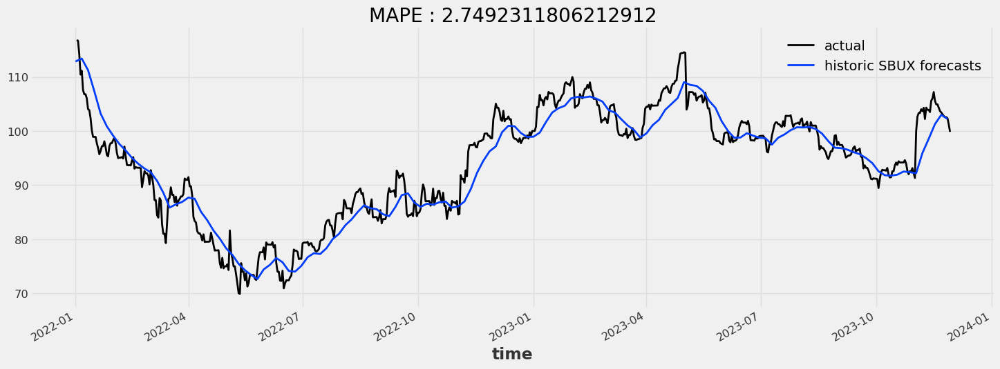

-----model loading path: /content/nbeats_interpretable_run-AMD----


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


NBEATSModel(generic_architecture=False, num_blocks=3, layer_widths=512, activation=LeakyReLU, input_chunk_length=30, output_chunk_length=7, n_epochs=10, nr_epochs_val_period=1, batch_size=800, random_state=42, model_name=nbeats_interpretable_run, save_checkpoints=True, force_reset=True)


Predicting: |          | 0/? [00:00<?, ?it/s]

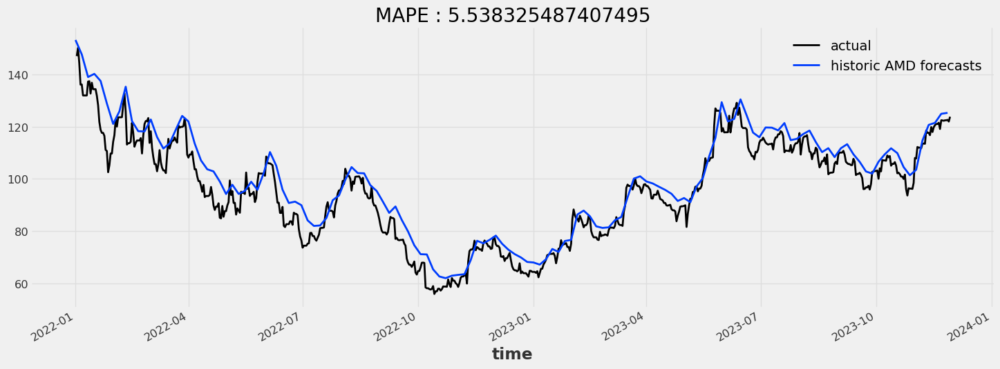

-----model loading path: /content/nbeats_interpretable_run-AMZN----


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


NBEATSModel(generic_architecture=False, num_blocks=3, layer_widths=512, activation=LeakyReLU, input_chunk_length=30, output_chunk_length=7, n_epochs=10, nr_epochs_val_period=1, batch_size=800, random_state=42, model_name=nbeats_interpretable_run, save_checkpoints=True, force_reset=True)


Predicting: |          | 0/? [00:00<?, ?it/s]

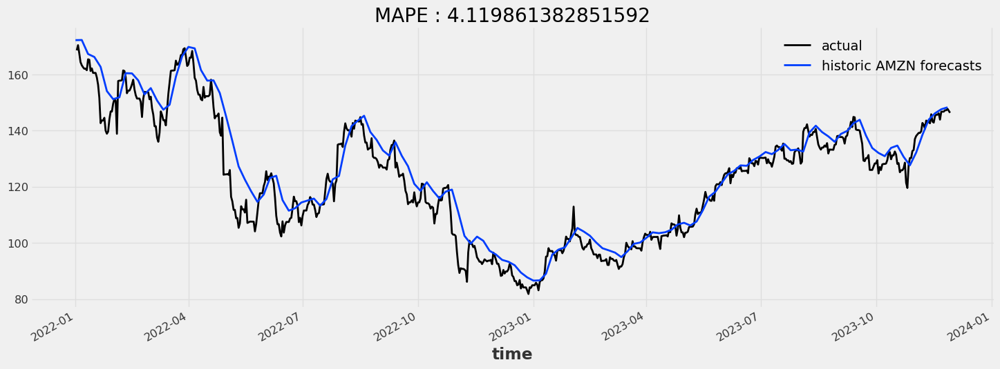

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


-----model loading path: /content/nbeats_interpretable_run-META----
NBEATSModel(generic_architecture=False, num_blocks=3, layer_widths=512, activation=LeakyReLU, input_chunk_length=30, output_chunk_length=7, n_epochs=10, nr_epochs_val_period=1, batch_size=800, random_state=42, model_name=nbeats_interpretable_run, save_checkpoints=True, force_reset=True)


INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

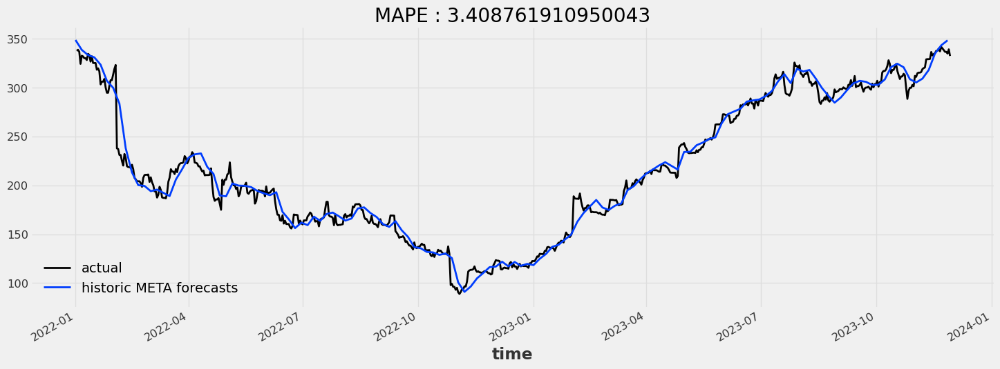

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


-----model loading path: /content/nbeats_interpretable_run-Nvidia----
NBEATSModel(generic_architecture=False, num_blocks=3, layer_widths=512, activation=LeakyReLU, input_chunk_length=30, output_chunk_length=7, n_epochs=10, nr_epochs_val_period=1, batch_size=800, random_state=42, model_name=nbeats_interpretable_run, save_checkpoints=True, force_reset=True)


Predicting: |          | 0/? [00:00<?, ?it/s]

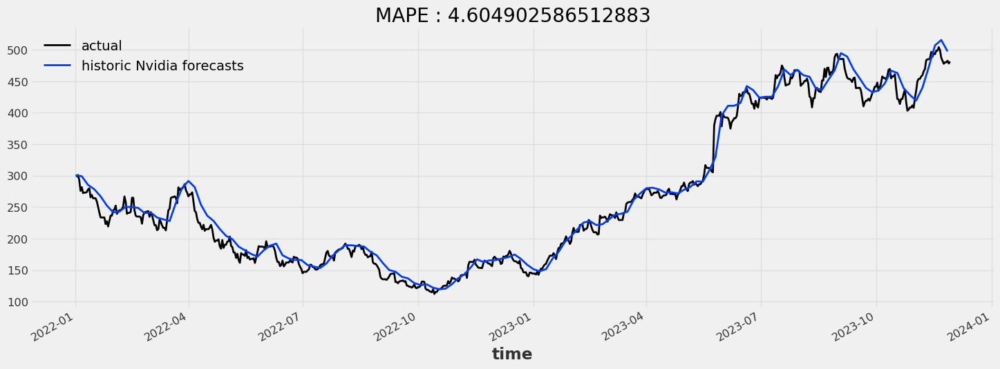

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


-----model loading path: /content/nbeats_interpretable_run-TSLA----
NBEATSModel(generic_architecture=False, num_blocks=3, layer_widths=512, activation=LeakyReLU, input_chunk_length=30, output_chunk_length=7, n_epochs=10, nr_epochs_val_period=1, batch_size=800, random_state=42, model_name=nbeats_interpretable_run, save_checkpoints=True, force_reset=True)


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

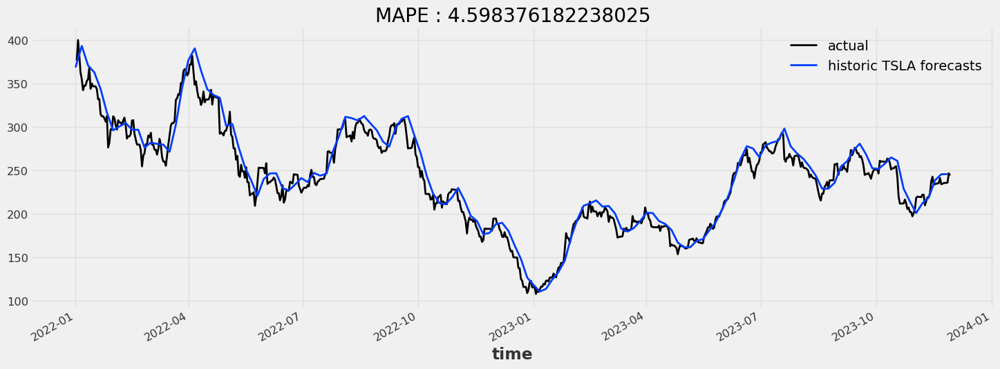

-----model loading path: /content/nbeats_interpretable_run-NFLX----
NBEATSModel(generic_architecture=False, num_blocks=3, layer_widths=512, activation=LeakyReLU, input_chunk_length=30, output_chunk_length=7, n_epochs=10, nr_epochs_val_period=1, batch_size=800, random_state=42, model_name=nbeats_interpretable_run, save_checkpoints=True, force_reset=True)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

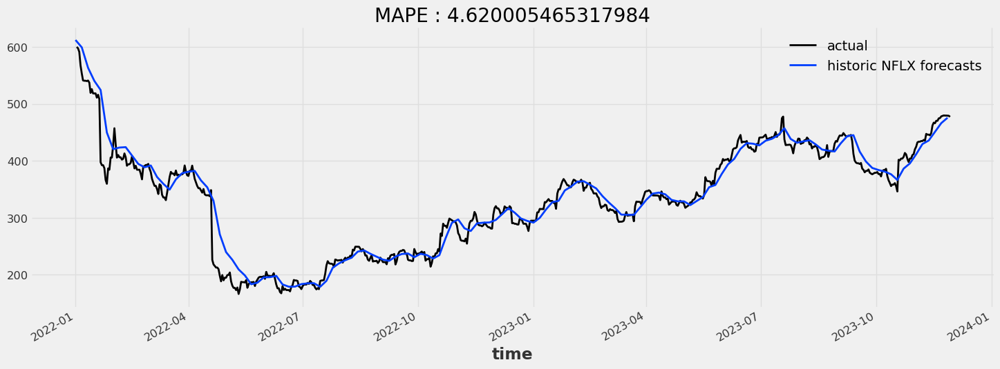

-----model loading path: /content/nbeats_interpretable_run-QCOM----


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


NBEATSModel(generic_architecture=False, num_blocks=3, layer_widths=512, activation=LeakyReLU, input_chunk_length=30, output_chunk_length=7, n_epochs=10, nr_epochs_val_period=1, batch_size=800, random_state=42, model_name=nbeats_interpretable_run, save_checkpoints=True, force_reset=True)


Predicting: |          | 0/? [00:00<?, ?it/s]

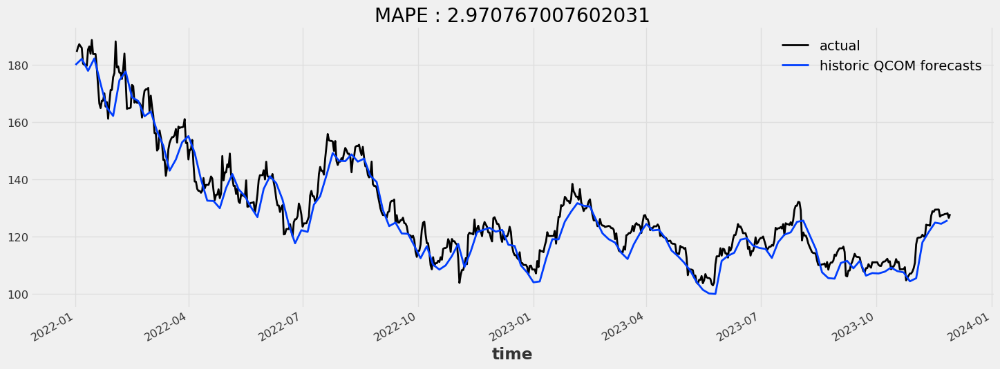

In [ ]:
data_dict=get_item_series_items(companies)
#please turn on gpu and run atleast 120
train_model_to_all_companies(data_dict,n_epochs=10)
show_graph(data_dict,path="/content")



Nbeats Paper Result
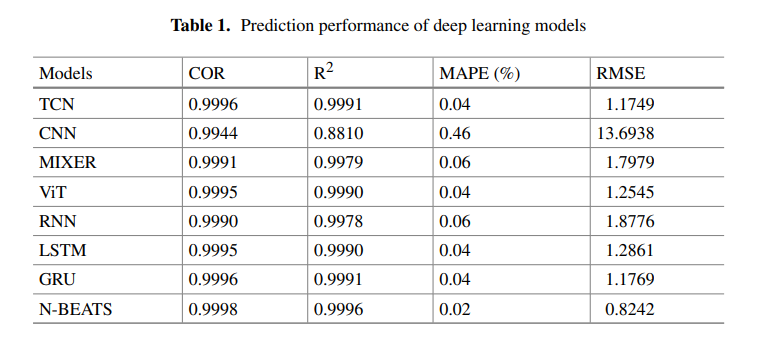

Result in Paper
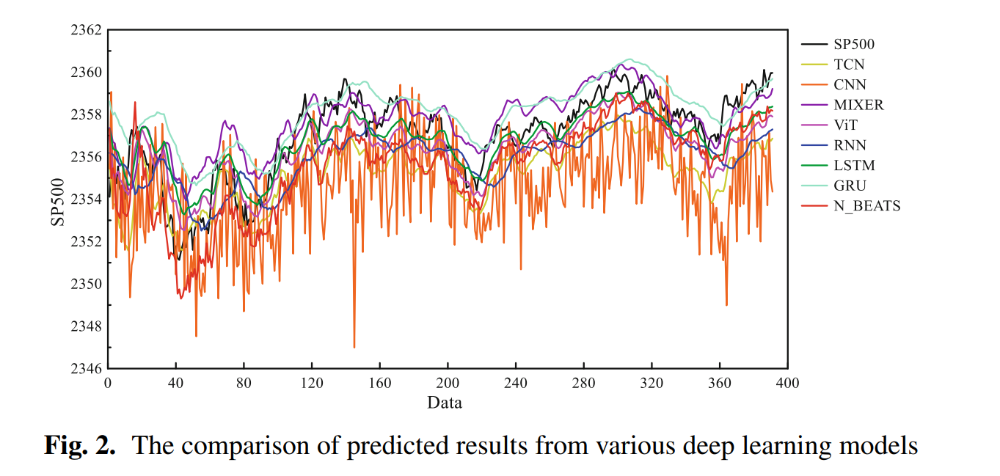